In [71]:
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import re
from extinction import ccm89, apply
import astropy.units as u

# Import Dessart Model Data

In [3]:
# Importing SN1994W Dessart model data
SN94W_49_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/sn94W_model_spectra/e1_v2_s2_7_Bs3_numes40_vt10.fl"
SN94W_57_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/sn94W_model_spectra/e1_v2_s2_5_B_0s1_numes20_vt10.fl"
SN94W_79_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/sn94W_model_spectra/e1_v2_s2_12_0s1_numes20_vt10.fl"
SN94W_89_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/sn94W_model_spectra/e1_v2_s2_12_0s_numes20_vt10.fl"

# Importing SN2010jl Dessart model data
SN10jl_20_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/sn2010jl_model_spectra/sn10jl3p_d20p8gn_100_vt20_NON_MON.fl"
SN10jl_41_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/sn2010jl_model_spectra/sn10jl3p_d41p7gn_100_vt20_NON_MON.fl"
SN10jl_62_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/sn2010jl_model_spectra/sn10jl3p_d62p5gn_100_vt20_NON_MON.fl"
SN10jl_83_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/sn2010jl_model_spectra/sn10jl3p_d83p3gn_100_vt20_NON_MON.fl"
SN10jl_104_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/sn2010jl_model_spectra/sn10jl3p_d104p2gn_100_vt20_NON_MON.fl"
SN10jl_125_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/sn2010jl_model_spectra/sn10jl3p_d125p0gn_100_vt20_NON_MON.fl"
SN10jl_145_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/sn2010jl_model_spectra/sn10jl3p_d145p8gn_100_vt20_NON_MON.fl"
SN10jl_166_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/sn2010jl_model_spectra/sn10jl3p_d166p7gn_100_vt20_NON_MON.fl"
SN10jl_208_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/sn2010jl_model_spectra/sn10jl3p_d208p3gn_100_vt20_NON_MON.fl"

# Importing SN2006bp Dessart model data
SN06bp_1half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/tst_n20_5_B.fl"
SN06bp_2half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/tst_n20_6_v1.fl"
SN06bp_7half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/n7_j20b_v4_s1_l3_v2.fl"
SN06bp_9half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/n7_j16b_v4_s1_l3_v1_B.fl"
SN06bp_11_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/n7_j12b_v4_s1_l3_v1_B.fl"
SN06bp_14half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/n16_n10_s0_v1_B_new2.fl"
SN06bp_15half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/n16_n10_s0_v1_B_new2_3.fl"
SN06bp_20half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/n16_n10_s0_v1_B_new6.fl"
SN06bp_22_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/n16_n10_s0_v1_B_new5.fl"
SN06bp_24_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/n16_n10_s0_v1_B_new4.fl"
SN06bp_30_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/nj4_1v1_new3_abund.fl"
SN06bp_41half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/nj4_1v1_new2_abund.fl"
SN06bp_56half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/nj4_1v1_new1_abund.fl"
SN06bp_72half_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/sn06bp_spec/nj4_1v1_new_abund.fl"

# Importing SN2005cs Dessart model data
SN05cs_3_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/cs0_1_l1b1_rho_v1_B.fl"
SN05cs_4_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/cs0_1_l1b1_rho3_B_v1.fl"
SN05cs_5_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/cs0_1_l1b1_rho3_B.fl"
SN05cs_6_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/cs0_1_l1b_B1_v1.fl"
SN05cs_7_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/cs0_1_l1b_B1_v1_2.fl"
SN05cs_8_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/cs0_1_l1b_B1_v1_5.fl"
SN05cs_9_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/cs1_7_abund.fl"
SN05cs_12_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/r3_ba.fl"
SN05cs_13_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/cs3_5.fl"
SN05cs_14_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/r3_e_abund.fl"
SN05cs_15_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/r3_abund.fl"
SN05cs_17_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/sn05cs/r3_g_abund.fl"

# Importing SN2012aw Dessart model data
SN12aw_10_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_1.fl"
SN12aw_11_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_2.fl"
SN12aw_12_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_3.fl"
SN12aw_13_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_4.fl"
SN12aw_14_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_5.fl"
SN12aw_16_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_6.fl"
SN12aw_17_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_7.fl"
SN12aw_19_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_8.fl"
SN12aw_21_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_9.fl"
SN12aw_23_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_10.fl"
SN12aw_26_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_11.fl"
SN12aw_28_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_12.fl"
SN12aw_31_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_13.fl"
SN12aw_34_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_14.fl"
SN12aw_38_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_15.fl"
SN12aw_42_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_16.fl"
SN12aw_46_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_17.fl"
SN12aw_50_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_18.fl"
SN12aw_55_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_19.fl"
SN12aw_61_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_20.fl"
SN12aw_67_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_21.fl"
SN12aw_74_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_22.fl"
SN12aw_81_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_23.fl"
SN12aw_89_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_24.fl"
SN12aw_98_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_25.fl"
SN12aw_108_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_26.fl"
SN12aw_119_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_27.fl"
SN12aw_121_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_28.fl"
SN12aw_124_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_29.fl"
SN12aw_126_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_30.fl"
SN12aw_129_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_31.fl"
SN12aw_131_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_32.fl"
SN12aw_134_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_33.fl"
SN12aw_137_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_34.fl"
SN12aw_139_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_35.fl"
SN12aw_142_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_36.fl"
SN12aw_145_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_37.fl"
SN12aw_148_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_38.fl"
SN12aw_151_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_39.fl"
SN12aw_154_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_40.fl"
SN12aw_157_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_41.fl"
SN12aw_160_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_42.fl"
SN12aw_163_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_43.fl"
SN12aw_166_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_44.fl"
SN12aw_175_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_45.fl"
SN12aw_187_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_46.fl"
SN12aw_200_m = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/12aw/15M_mdot1p5_47.fl"

# Import Swift Observational Data

In [4]:
# Importing SN2010jl Swift data
SN10jl_2d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/00031858002sumspectrum.txt"
SN10jl_3d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/00031858004sumspectrum.txt"
SN10jl_9d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIn/1SN2010jl/00031858014sumspectrum.txt"

# Importing SN2006bp Swift data
SN06bp_3_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/00030390005sumspectrum.txt"
SN06bp_5_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/00030390007sumspectrum.txt"
SN06bp_6_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/00030390008sumspectrum.txt"
SN06bp_7_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/00030390015sumspectrum.txt"
SN06bp_8_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/00030390016sumspectrum.txt"
SN06bp_9_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/00030390020sumspectrum.txt"
SN06bp_14_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/2SN2006bp/00030390026sumspectrum.txt"

# Importing SN2005cs Swift data
SN05cs_7_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/00030083008e1spectrum.txt"
SN05cs_9_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/00030083012e1spectrum.txt"
SN05cs_12_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/00030083017e1spectrum.txt"
SN05cs_15_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/00030083023e1spectrum.txt"
SN05cs_17_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/00030083027e1spectrum.txt"
SN05cs_23_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeIIP/1SN2005cs/00030083035e1spectrum.txt"

# Importing SN2012aw Swift data
SN12aw_5d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032319001sumspectrum.txt"
SN12aw_7d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032319002sumspectrum.txt"
SN12aw_9d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032319003sumspectrum.txt"
SN12aw_12d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032319004sumspectrum.txt"
SN12aw_14d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032319005sumspectrum.txt"
SN12aw_16d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032319006sumspectrum.txt"
SN12aw_42d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032315020sumspectrum.txt"
SN12aw_43d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032315022sumspectrum.txt"
SN12aw_45d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032315024sumspectrum.txt"
SN12aw_46d_o = "/Users/micalynrowe/Desktop/TAMU/3SUMMER2020/TypeII/6SN2012aw/00032315026sumspectrum.txt"

# Plotting

In [5]:
# creating plotting function
def plot(model,obs,sndistance,fudge,ybot,ytop):
    # first import the model data
    wave_m, flux_m = np.loadtxt(model, unpack=True)
    # then import the observed spectra
    wave_o, flux_o, fluxerr_o = np.loadtxt(obs, unpack=True)
    # setting up file name grab
    def varName(p):
        for k, v in globals().items():
            if id(p) == id(v):
                return k
    # turning into string
    modelstr = varName(model)
    obsstr = varName(obs)
    # getting SN part
    def split_at(s, c, n):
        words = s.split(c)
        return c.join(words[:n]), c.join(words[n:])
    modelname = split_at(modelstr,'_',1)
    obsname = split_at(obsstr,'_',1)
    modelalmostday = split_at(modelstr,'_',2)
    modelday = split_at(modelalmostday[0],'_',1)
    obsalmostday = split_at(obsstr,'_',2)
    obsday = split_at(obsalmostday[0],'_',1)
    # correcting for distance
    modeld = 1000 # distance for Dessart Model in pc
    scalefactor = (modeld**2)/(sndistance**2) # sndistance must be in pc
    # now set up the plotting
    plt.rcParams.update({
        "lines.color": "black",
        "patch.edgecolor": "black",
        "text.color": "black",
        "axes.facecolor": "white",
        "axes.edgecolor": "black",
        "axes.labelcolor": "black",
        "xtick.color": "black",
        "ytick.color": "black",
        "grid.color": "white",
        "figure.facecolor": "white",
        "figure.edgecolor": "black",
        "savefig.facecolor": "white",
        "savefig.edgecolor": "black"})
    font = 25
    plt.rcParams["font.family"] = "arial"
    plt.rcParams.update({'font.size': font})
    fig = plt.figure(figsize=(30, 10), dpi= 80, facecolor='w', edgecolor='k')
    plt.title(modelname[0]+' Dessart Model vs '+obsname[0]+' Grism Spectrum',fontsize=font)
    plt.plot(wave_o,flux_o,label=obsday[1]+' days Grism Spectrum',linewidth=2,c='black')
    plt.plot(wave_m,flux_m*scalefactor*fudge,label=modelday[1]+' days Dessart Model',linewidth=3,linestyle='dashed',c='red')
    plt.legend(loc=1,fontsize=font,ncol=2)
    plt.xlabel("Wavelength " r'($ \AA $)',fontsize=font)
    plt.ylabel("Flux " r'($ erg*s^{-1} cm^{-2} \AA^{-1} $)',fontsize=font)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.ylim(ybot,ytop)
    plt.xlim(1500,8000)
    plt.show()

## SN2010jl

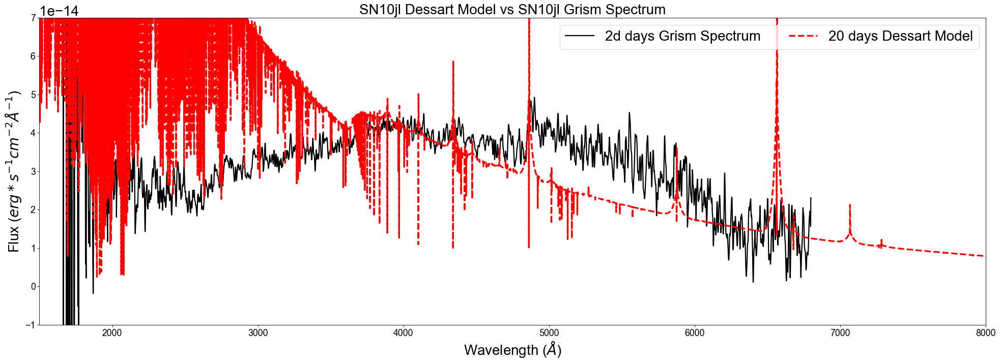

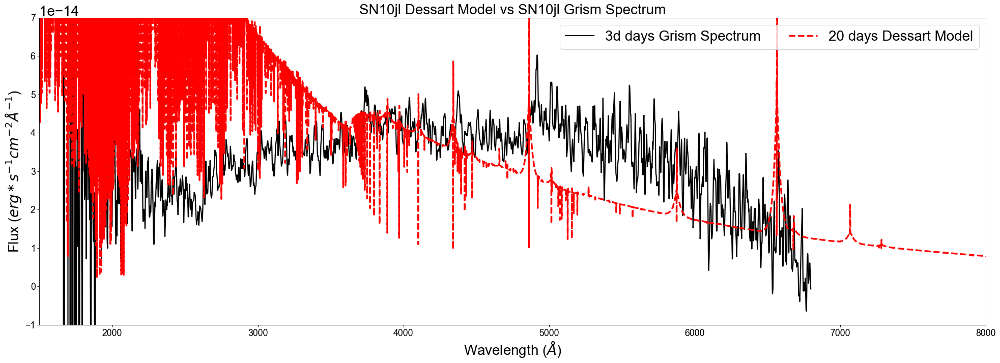

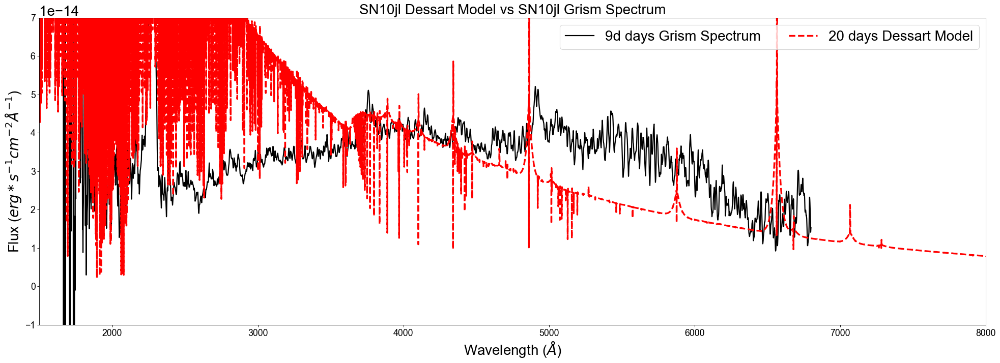

In [6]:
plot(SN10jl_20_m,SN10jl_2d_o,50*10**6,5,-0.00000000000001,0.00000000000007)
plot(SN10jl_20_m,SN10jl_3d_o,50*10**6,5,-0.00000000000001,0.00000000000007)
plot(SN10jl_20_m,SN10jl_9d_o,50*10**6,5,-0.00000000000001,0.00000000000007)

## SN2006bp

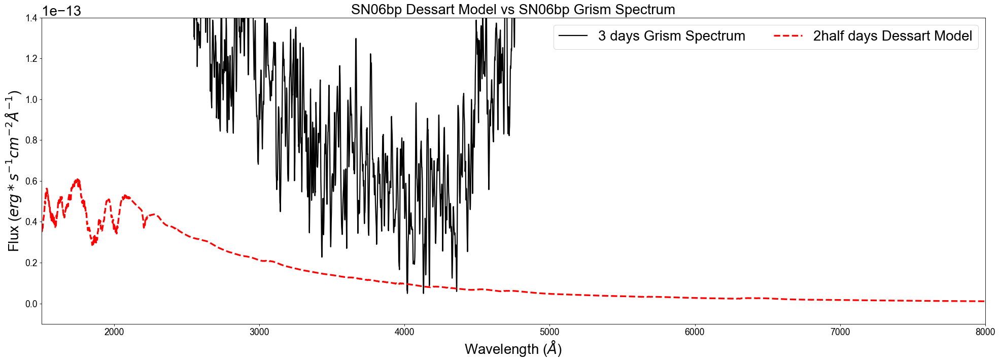

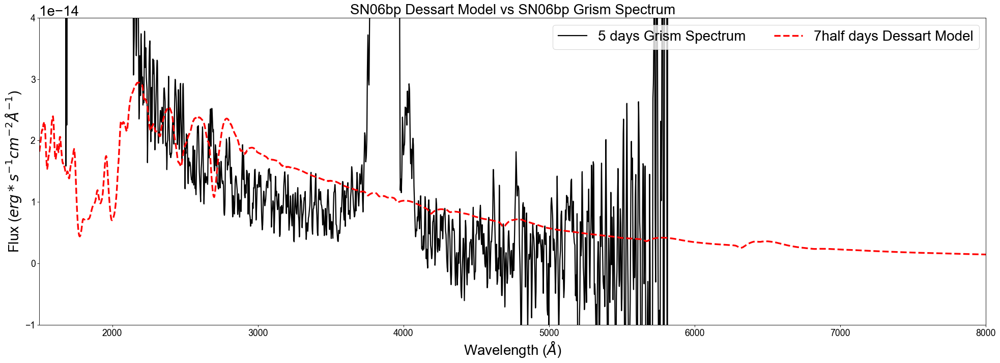

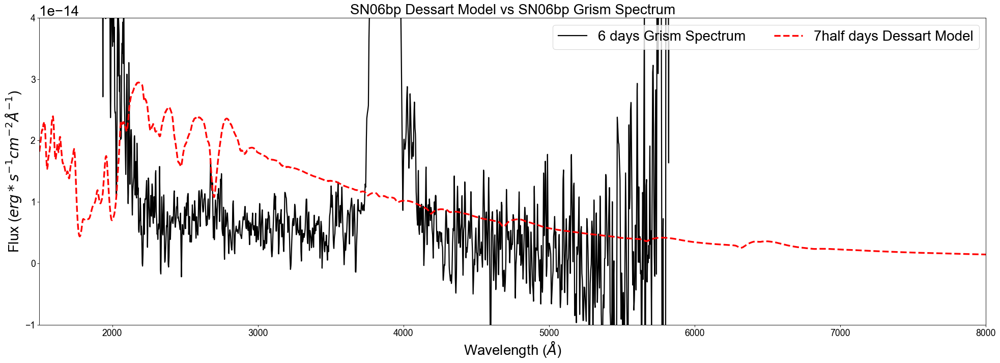

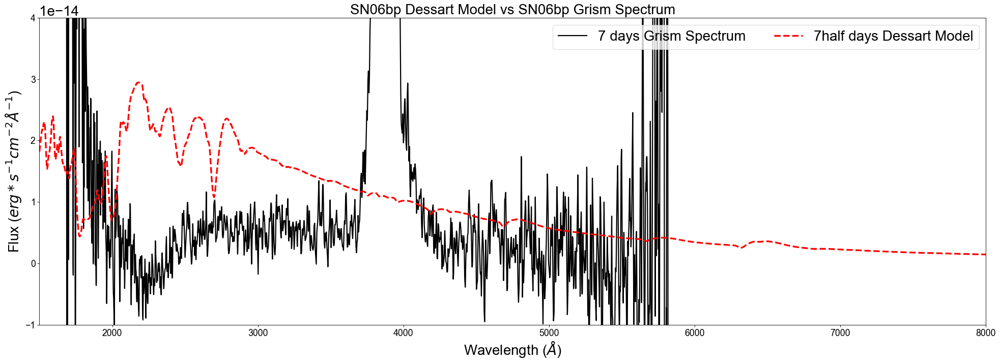

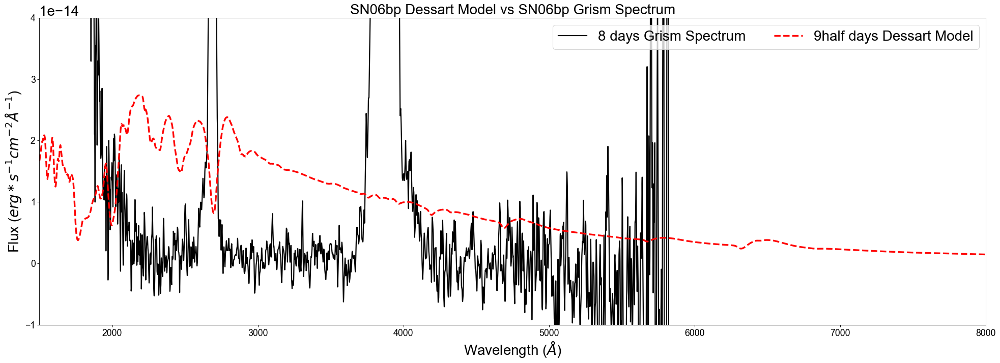

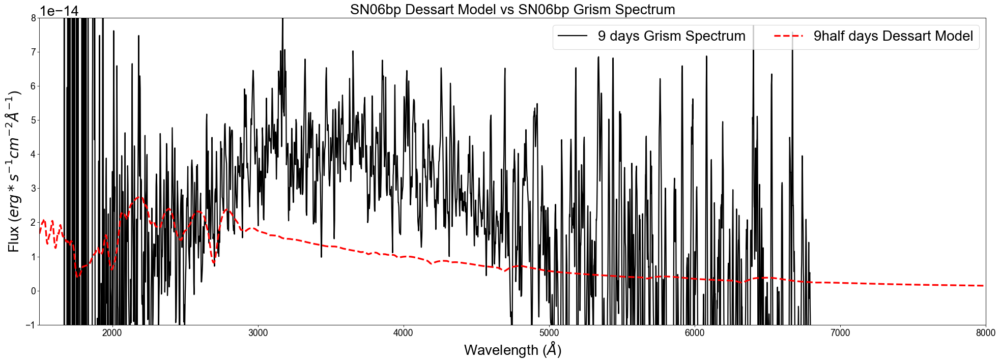

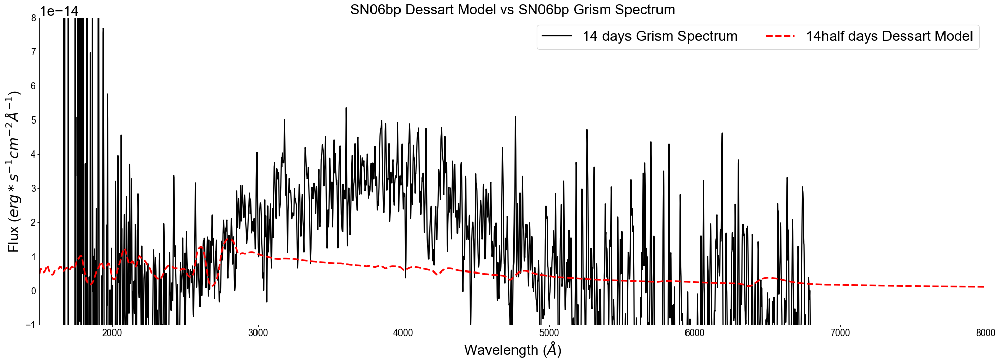

In [7]:
plot(SN06bp_2half_m,SN06bp_3_o,17.5*10**6,1,-0.00000000000001,0.00000000000014)
plot(SN06bp_7half_m,SN06bp_5_o,17.5*10**6,1,-0.00000000000001,0.00000000000004)
plot(SN06bp_7half_m,SN06bp_6_o,17.5*10**6,1,-0.00000000000001,0.00000000000004)
plot(SN06bp_7half_m,SN06bp_7_o,17.5*10**6,1,-0.00000000000001,0.00000000000004)
plot(SN06bp_9half_m,SN06bp_8_o,17.5*10**6,1,-0.00000000000001,0.00000000000004)
plot(SN06bp_9half_m,SN06bp_9_o,17.5*10**6,1,-0.00000000000001,0.00000000000008)
plot(SN06bp_14half_m,SN06bp_14_o,17.5*10**6,1,-0.00000000000001,0.00000000000008)

## SN2005cs

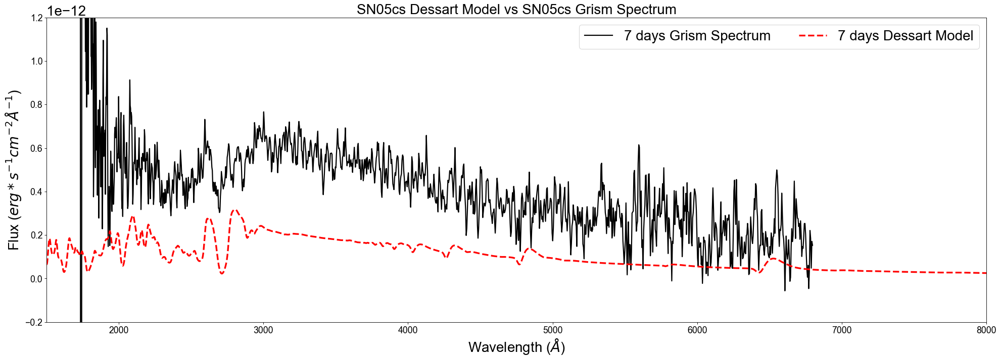

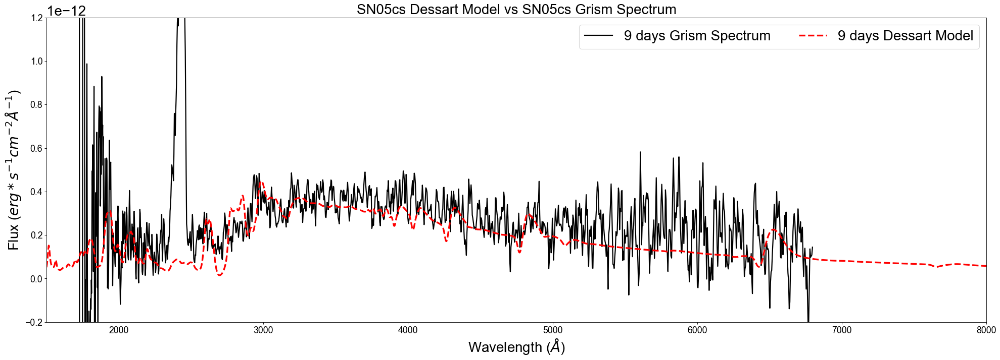

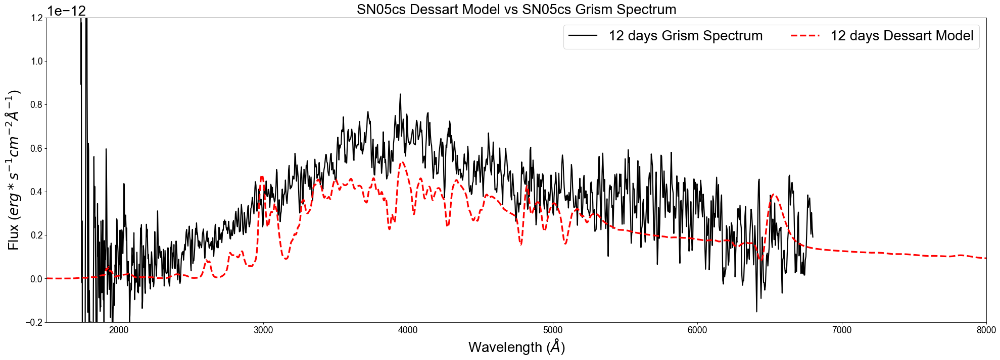

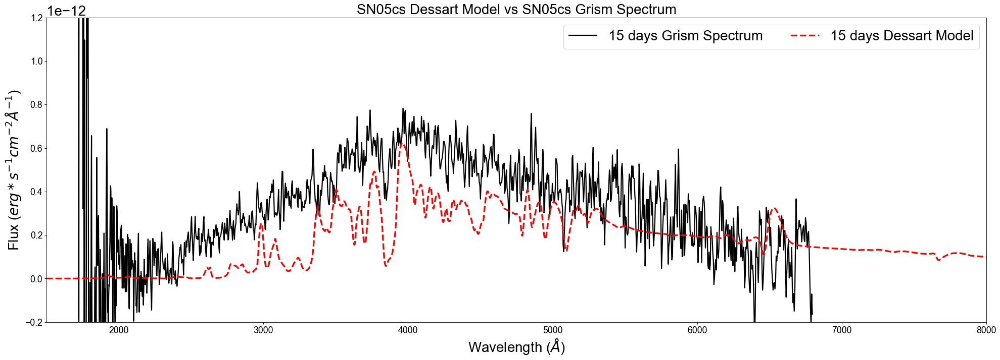

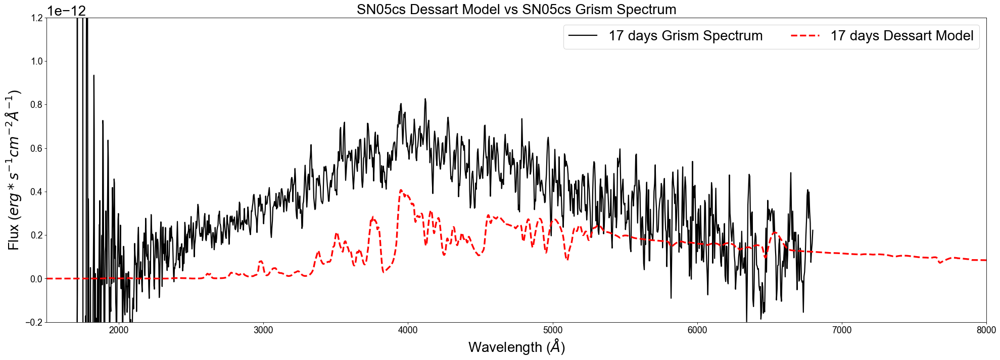

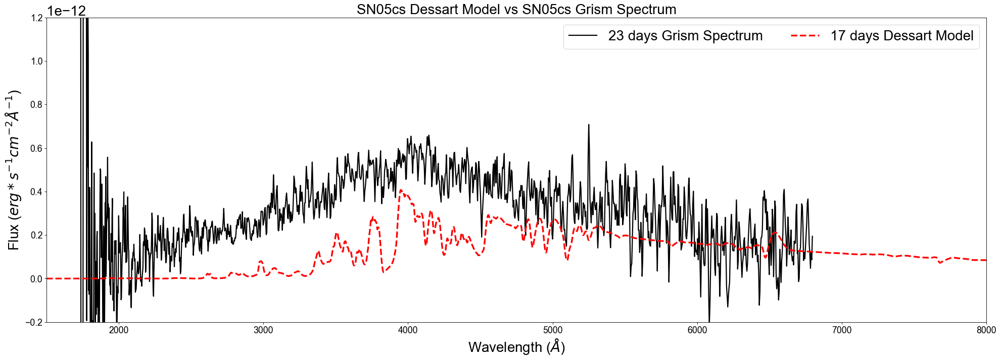

In [8]:
plot(SN05cs_7_m,SN05cs_7_o,7.49*10**6,10,-0.0000000000002,0.0000000000012)
plot(SN05cs_9_m,SN05cs_9_o,7.49*10**6,25,-0.0000000000002,0.0000000000012)
plot(SN05cs_12_m,SN05cs_12_o,7.49*10**6,25,-0.0000000000002,0.0000000000012)
plot(SN05cs_15_m,SN05cs_15_o,7.49*10**6,25,-0.0000000000002,0.0000000000012)
plot(SN05cs_17_m,SN05cs_17_o,7.49*10**6,25,-0.0000000000002,0.0000000000012)
plot(SN05cs_17_m,SN05cs_23_o,7.49*10**6,25,-0.0000000000002,0.0000000000012)

## SN2012aw

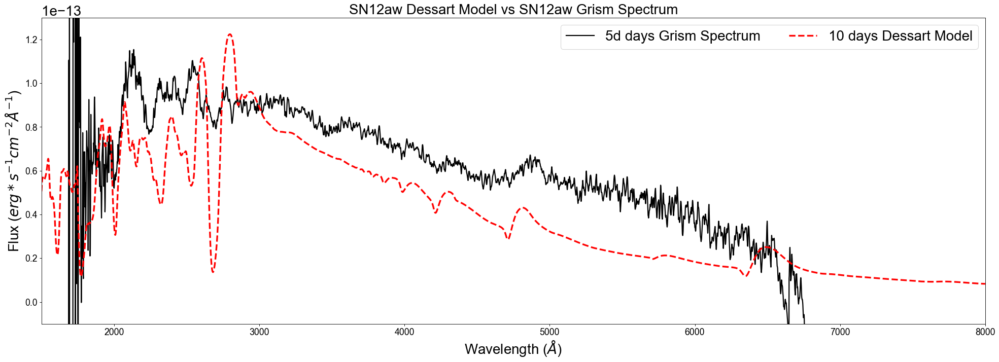

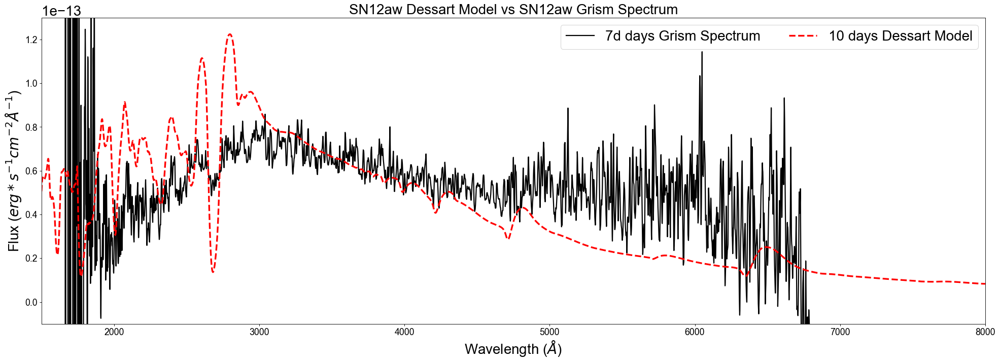

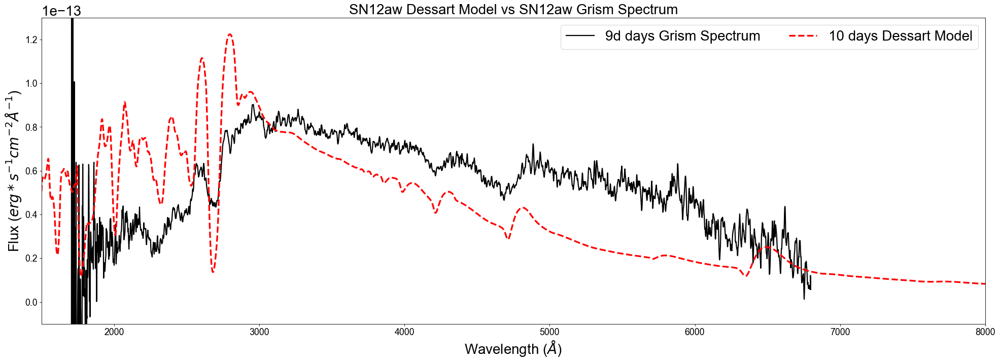

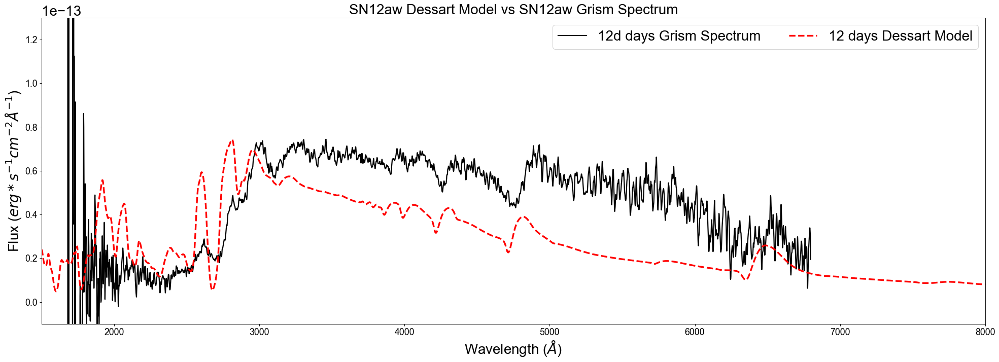

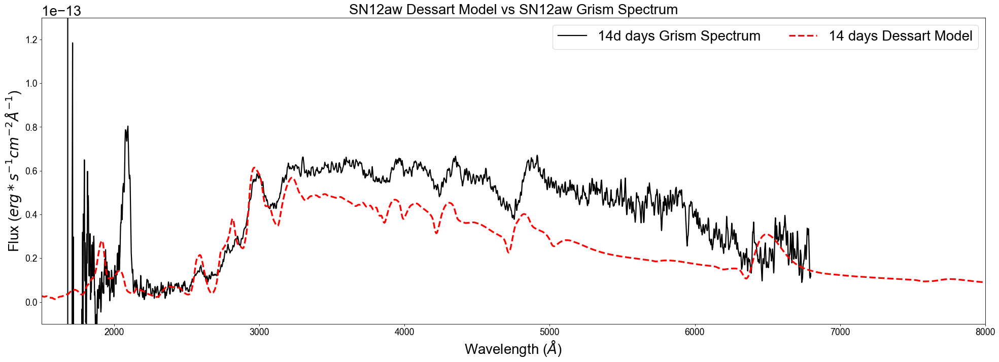

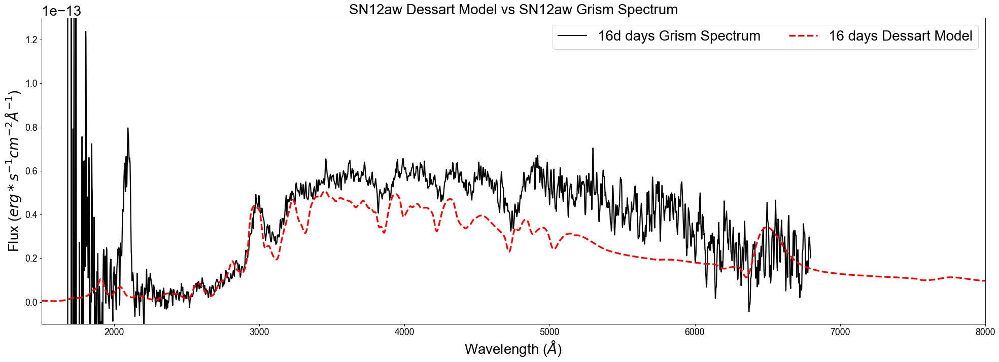

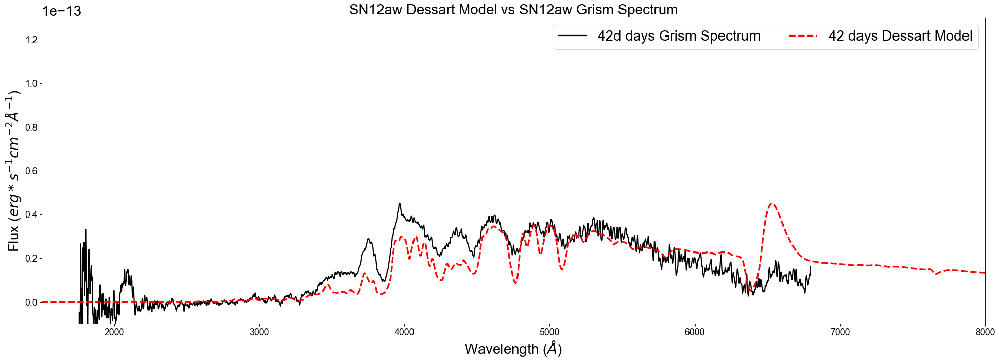

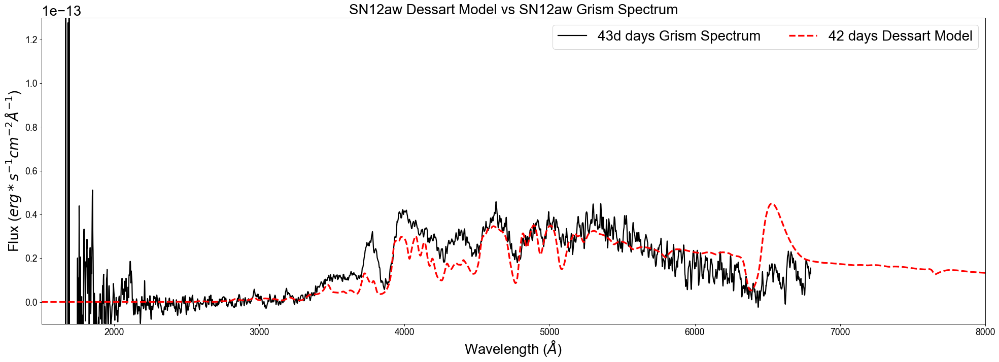

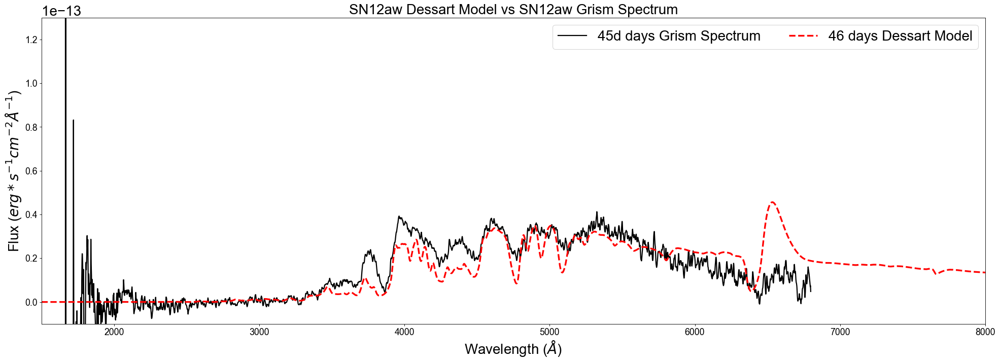

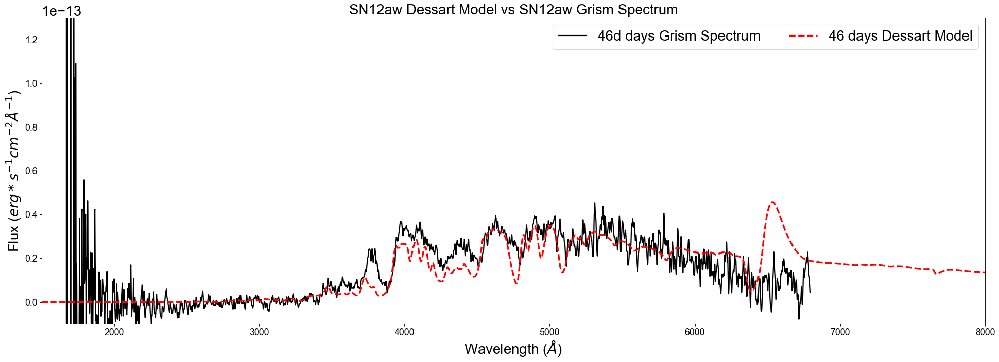

In [9]:
plot(SN12aw_10_m,SN12aw_5d_o,9*10**6,1,-0.00000000000001,0.00000000000013)
plot(SN12aw_10_m,SN12aw_7d_o,9*10**6,1,-0.00000000000001,0.00000000000013)
plot(SN12aw_10_m,SN12aw_9d_o,9*10**6,1,-0.00000000000001,0.00000000000013)
plot(SN12aw_12_m,SN12aw_12d_o,9*10**6,1,-0.00000000000001,0.00000000000013)
plot(SN12aw_14_m,SN12aw_14d_o,9*10**6,1,-0.00000000000001,0.00000000000013)
plot(SN12aw_16_m,SN12aw_16d_o,9*10**6,1,-0.00000000000001,0.00000000000013)
plot(SN12aw_42_m,SN12aw_42d_o,9*10**6,1,-0.00000000000001,0.00000000000013)
plot(SN12aw_42_m,SN12aw_43d_o,9*10**6,1,-0.00000000000001,0.00000000000013)
plot(SN12aw_46_m,SN12aw_45d_o,9*10**6,1,-0.00000000000001,0.00000000000013)
plot(SN12aw_46_m,SN12aw_46d_o,9*10**6,1,-0.00000000000001,0.00000000000013)

# Reddening

## Plotting for Cardelli, Clayton & Mathis (1989) extinction function

In [93]:
# https://extinction.readthedocs.io/en/latest/api/extinction.ccm89.html
# creating reddened ccm89 plotting function for reddened model vs obs
# rv = 3.1 for ISM
# ebv = ? depending on the SN
def redplot_c89(model,obs,sndistance,fudge,ybot,ytop,rv,ebv):
    ###################### first import the model data
    wave_m, flux_m = np.loadtxt(model, unpack=True)
    ###################### then import the observed spectra
    wave_o, flux_o, fluxerr_o = np.loadtxt(obs, unpack=True)
    ###################### reddening the model spectrum
    av = ebv*rv
    redflux_m = apply(ccm89(wave_m, av, rv, unit='aa', out=None), flux_m)
    ###################### setting up file name grab
    def varName(p):
        for k, v in globals().items():
            if id(p) == id(v):
                return k
    # turning into string
    modelstr = varName(model)
    obsstr = varName(obs)
    # getting SN part
    def split_at(s, c, n):
        words = s.split(c)
        return c.join(words[:n]), c.join(words[n:])
    modelname = split_at(modelstr,'_',1)
    obsname = split_at(obsstr,'_',1)
    modelalmostday = split_at(modelstr,'_',2)
    modelday = split_at(modelalmostday[0],'_',1)
    obsalmostday = split_at(obsstr,'_',2)
    obsday = split_at(obsalmostday[0],'_',1)
    ###################### correcting for distance
    modeld = 1000 # distance for Dessart Model in pc
    scalefactor = (modeld**2)/(sndistance**2) # sndistance must be in pc
    ###################### now set up the plotting
    plt.rcParams.update({
        "lines.color": "black",
        "patch.edgecolor": "black",
        "text.color": "black",
        "axes.facecolor": "white",
        "axes.edgecolor": "black",
        "axes.labelcolor": "black",
        "xtick.color": "black",
        "ytick.color": "black",
        "grid.color": "white",
        "figure.facecolor": "white",
        "figure.edgecolor": "black",
        "savefig.facecolor": "white",
        "savefig.edgecolor": "black"})
    font = 25
    plt.rcParams["font.family"] = "arial"
    plt.rcParams.update({'font.size': font})
    fig = plt.figure(figsize=(30, 10), dpi= 80, facecolor='w', edgecolor='k')
    plt.title(modelname[0]+' Reddened Dessart Model vs '+obsname[0]+' Grism Spectrum',fontsize=font)
    plt.plot(wave_o,flux_o,label=obsday[1]+' days Grism Spectrum',linewidth=2,c='black')
    plt.plot(wave_m,redflux_m*scalefactor*fudge,label=modelday[1]+' days Reddened Dessart Model',linewidth=3,linestyle='dashed',c='red')
    plt.legend(loc=1,fontsize=font,ncol=2)
    plt.xlabel("Wavelength " r'($ \AA $)',fontsize=font)
    plt.ylabel("Flux " r'($ erg*s^{-1} cm^{-2} \AA^{-1} $)',fontsize=font)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.ylim(ybot,ytop)
    plt.xlim(1500,8000)
    plt.show()

### SN2006bp C89 Reddened Model vs. Observations

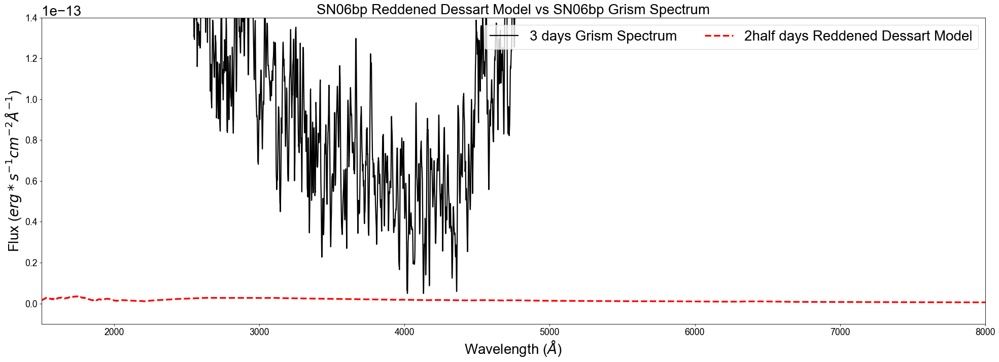

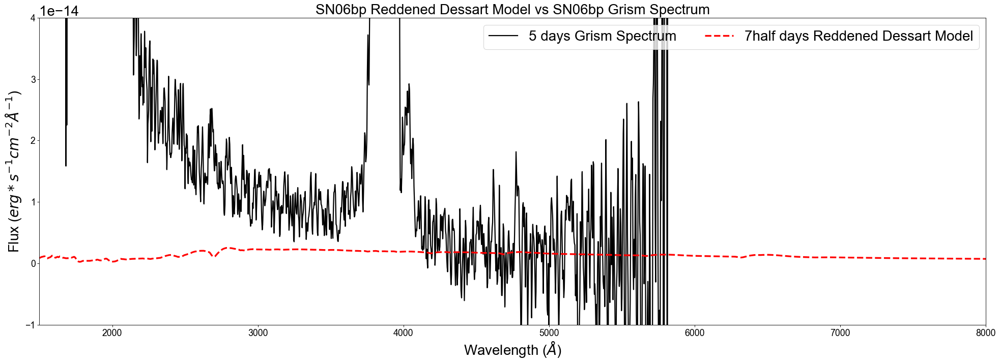

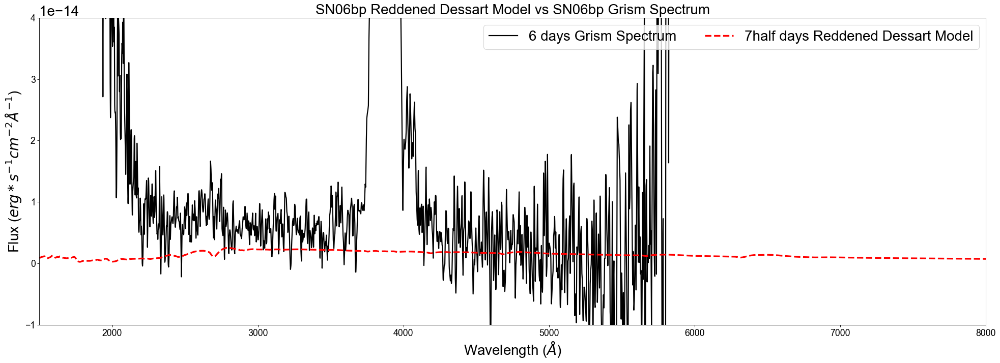

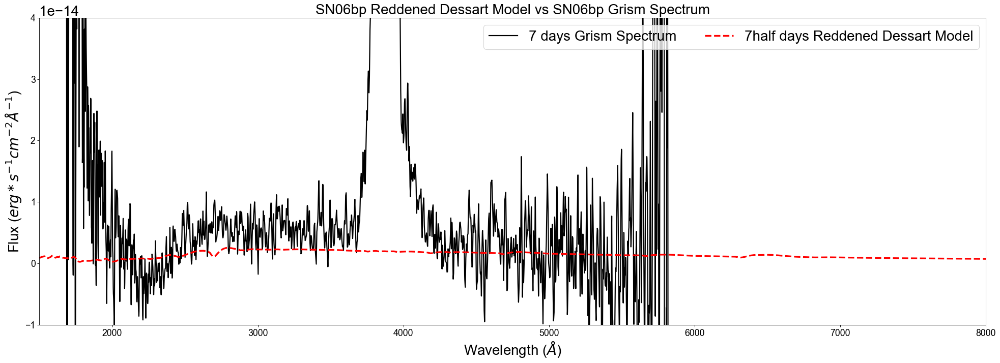

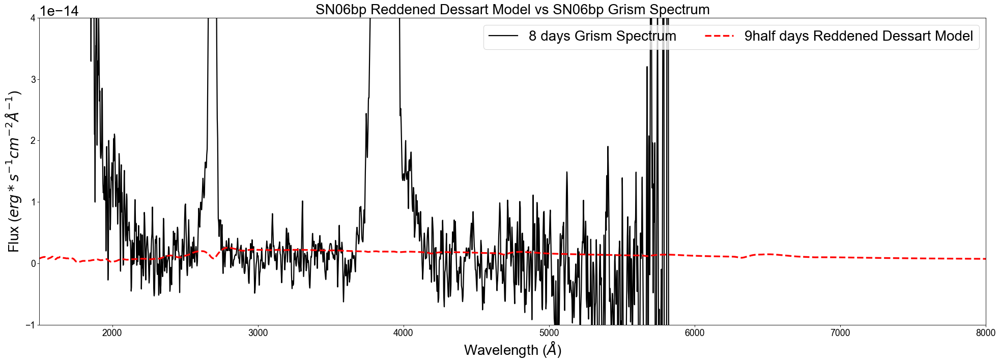

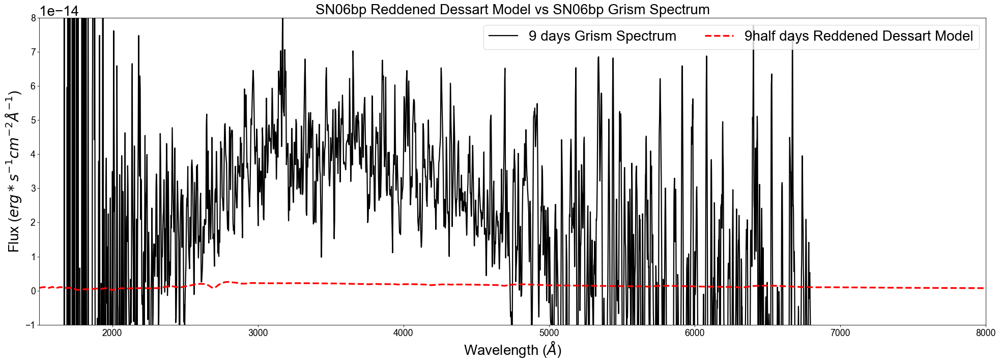

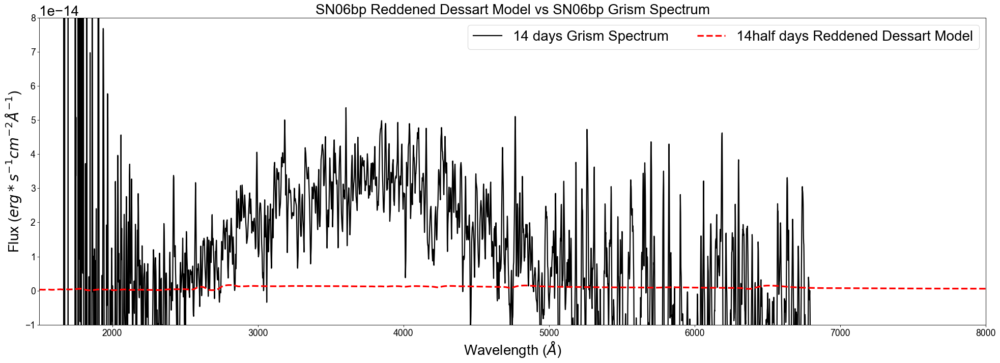

In [94]:
redplot_c89(SN06bp_2half_m,SN06bp_3_o,17.5*10**6,1,-0.00000000000001,0.00000000000014,3.1,0.4)
redplot_c89(SN06bp_7half_m,SN06bp_5_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
redplot_c89(SN06bp_7half_m,SN06bp_6_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
redplot_c89(SN06bp_7half_m,SN06bp_7_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
redplot_c89(SN06bp_9half_m,SN06bp_8_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
redplot_c89(SN06bp_9half_m,SN06bp_9_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)
redplot_c89(SN06bp_14half_m,SN06bp_14_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)

### SN2005cs C89 Reddened  Model vs. Observations

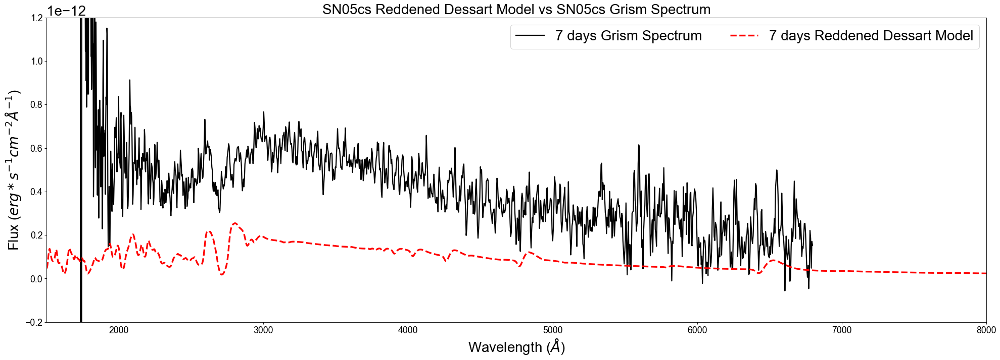

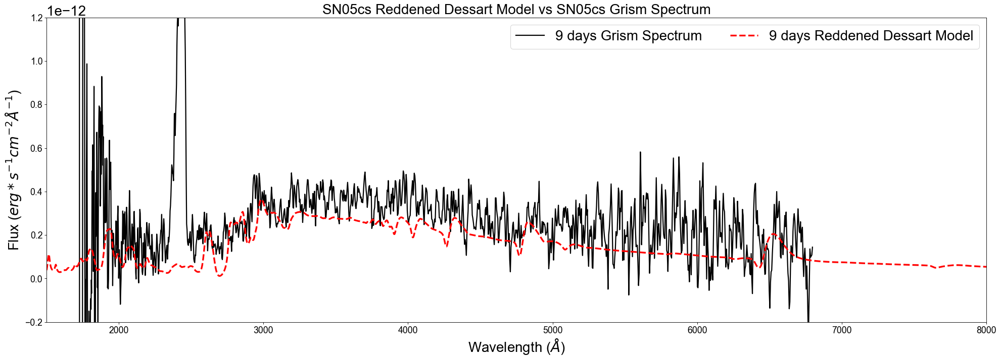

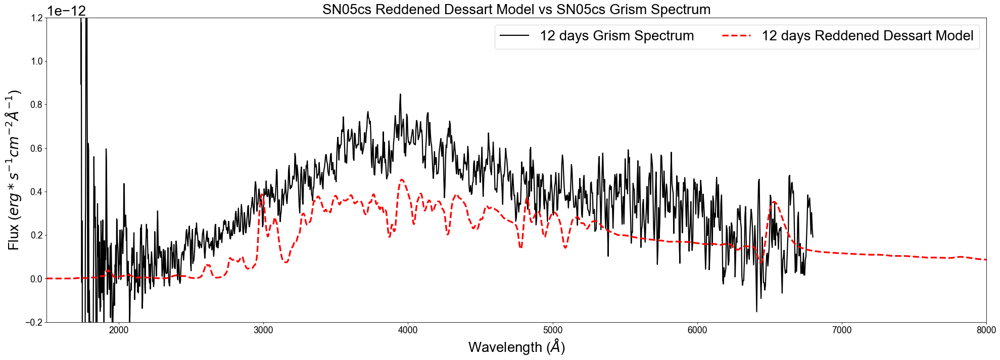

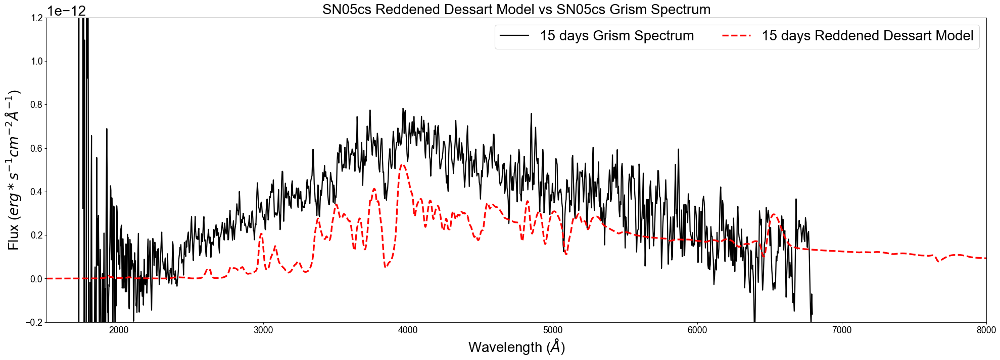

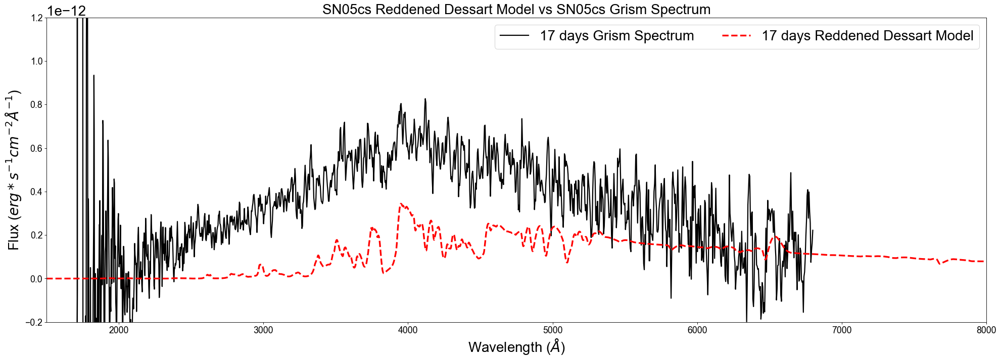

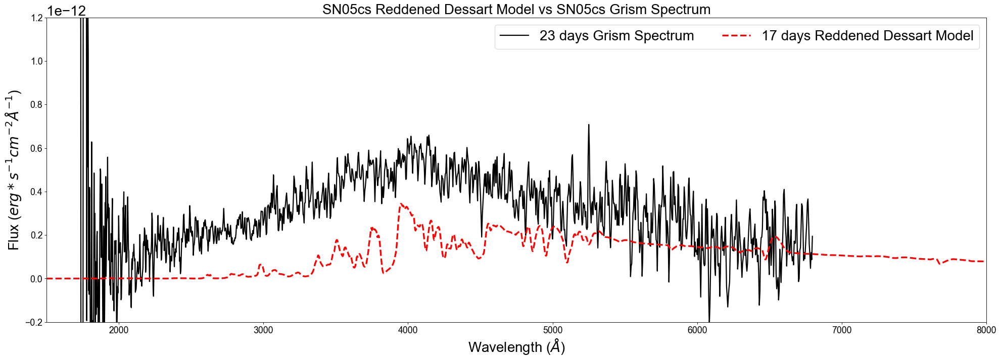

In [95]:
redplot_c89(SN05cs_7_m,SN05cs_7_o,7.49*10**6,10,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_c89(SN05cs_9_m,SN05cs_9_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_c89(SN05cs_12_m,SN05cs_12_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_c89(SN05cs_15_m,SN05cs_15_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_c89(SN05cs_17_m,SN05cs_17_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_c89(SN05cs_17_m,SN05cs_23_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)

In [96]:
# creating reddened ccm89 plotting function for model vs. reddened model
def rednnotplot_c89(model,obs,sndistance,fudge,ybot,ytop,rv,ebv):
    ###################### first import the model data
    wave_m, flux_m = np.loadtxt(model, unpack=True)
    ###################### reddening the model spectrum
    av = ebv*rv
    redflux_m = apply(ccm89(wave_m, av, rv, unit='aa', out=None), flux_m)
    ###################### setting up file name grab
    def varName(p):
        for k, v in globals().items():
            if id(p) == id(v):
                return k
    # turning into string
    modelstr = varName(model)
    # getting SN part
    def split_at(s, c, n):
        words = s.split(c)
        return c.join(words[:n]), c.join(words[n:])
    modelname = split_at(modelstr,'_',1)
    modelalmostday = split_at(modelstr,'_',2)
    modelday = split_at(modelalmostday[0],'_',1)
    ###################### correcting for distance
    modeld = 1000 # distance for Dessart Model in pc
    scalefactor = (modeld**2)/(sndistance**2) # sndistance must be in pc
    ###################### now set up the plotting
    plt.rcParams.update({
        "lines.color": "black",
        "patch.edgecolor": "black",
        "text.color": "black",
        "axes.facecolor": "white",
        "axes.edgecolor": "black",
        "axes.labelcolor": "black",
        "xtick.color": "black",
        "ytick.color": "black",
        "grid.color": "white",
        "figure.facecolor": "white",
        "figure.edgecolor": "black",
        "savefig.facecolor": "white",
        "savefig.edgecolor": "black"})
    font = 25
    plt.rcParams["font.family"] = "arial"
    plt.rcParams.update({'font.size': font})
    fig = plt.figure(figsize=(30, 10), dpi= 80, facecolor='w', edgecolor='k')
    plt.title(modelname[0]+' Dessart Model vs '+modelname[0]+' Reddened Dessart Model',fontsize=font)
    plt.plot(wave_m,flux_m*scalefactor*fudge,label=modelday[1]+' days Dessart Model',linewidth=3,c='black')
    plt.plot(wave_m,redflux_m*scalefactor*fudge,label=modelday[1]+' days Reddened Dessart Model',linewidth=3,linestyle='dashed',c='red')
    plt.legend(loc=1,fontsize=font,ncol=2)
    plt.xlabel("Wavelength " r'($ \AA $)',fontsize=font)
    plt.ylabel("Flux " r'($ erg*s^{-1} cm^{-2} \AA^{-1} $)',fontsize=font)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.ylim(ybot,ytop)
    plt.xlim(1500,8000)
    plt.show()

### SN2006bp Model vs. C89 Reddened Model

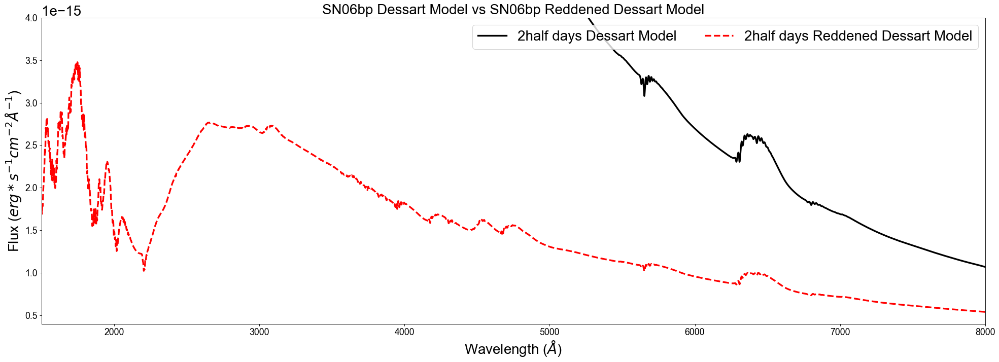

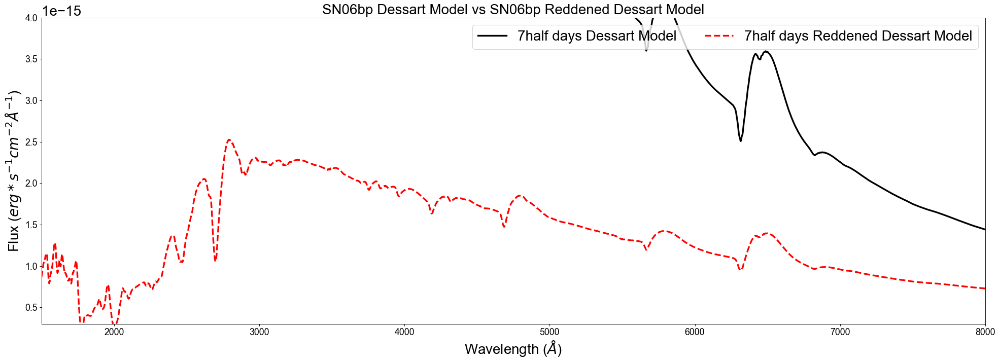

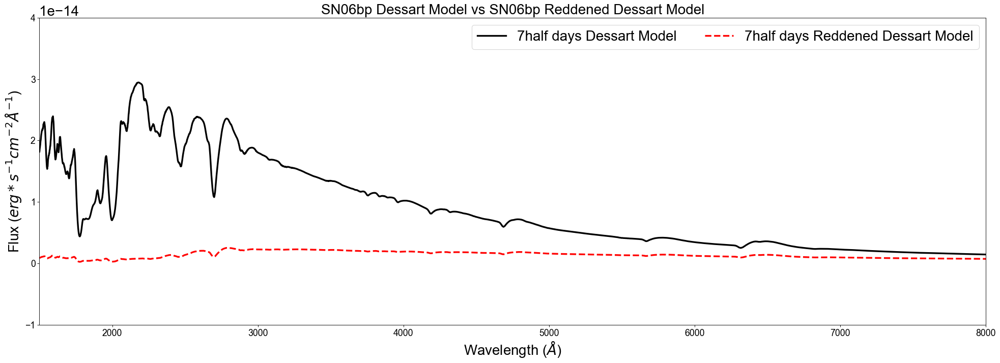

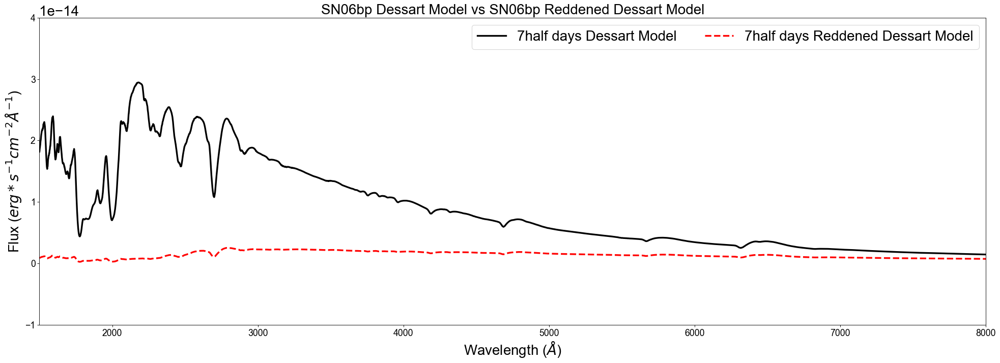

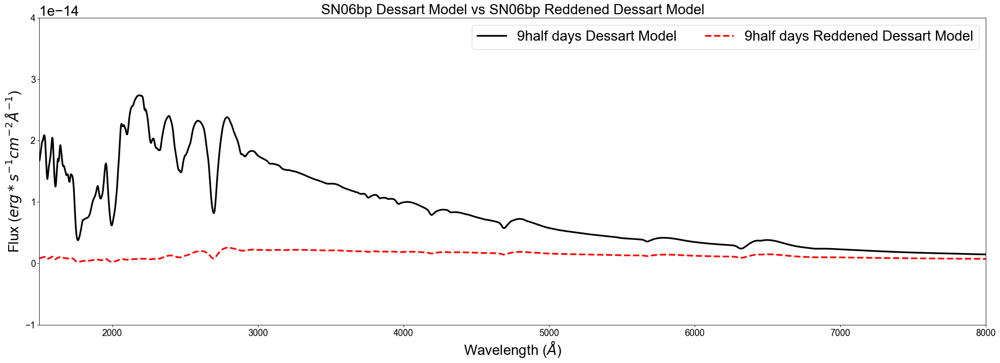

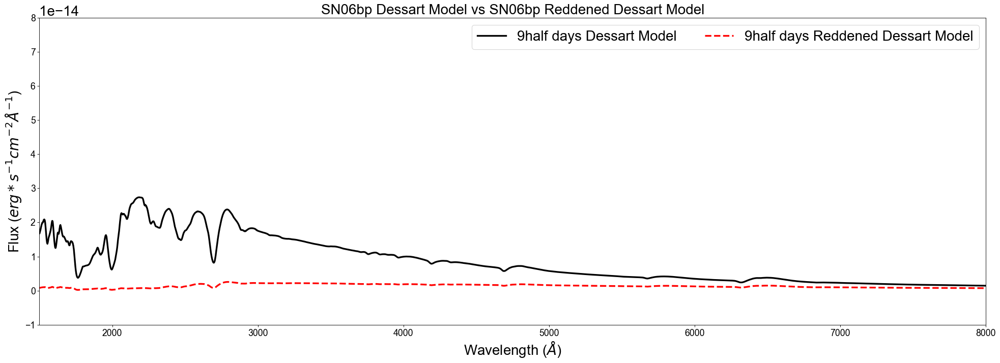

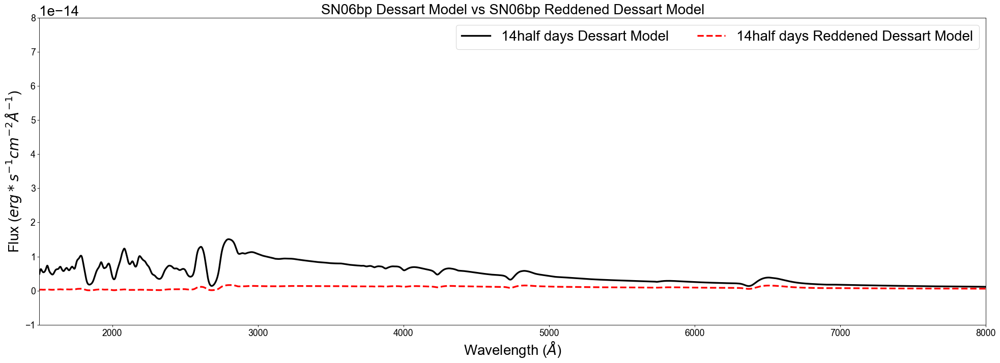

In [97]:
rednnotplot_c89(SN06bp_2half_m,SN06bp_3_o,17.5*10**6,1,0.0000000000000004,0.000000000000004,3.1,0.4)
rednnotplot_c89(SN06bp_7half_m,SN06bp_5_o,17.5*10**6,1,0.0000000000000003,0.000000000000004,3.1,0.4)
rednnotplot_c89(SN06bp_7half_m,SN06bp_6_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
rednnotplot_c89(SN06bp_7half_m,SN06bp_7_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
rednnotplot_c89(SN06bp_9half_m,SN06bp_8_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
rednnotplot_c89(SN06bp_9half_m,SN06bp_9_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)
rednnotplot_c89(SN06bp_14half_m,SN06bp_14_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)

### SN2005cs Model vs. C89 Reddened Model

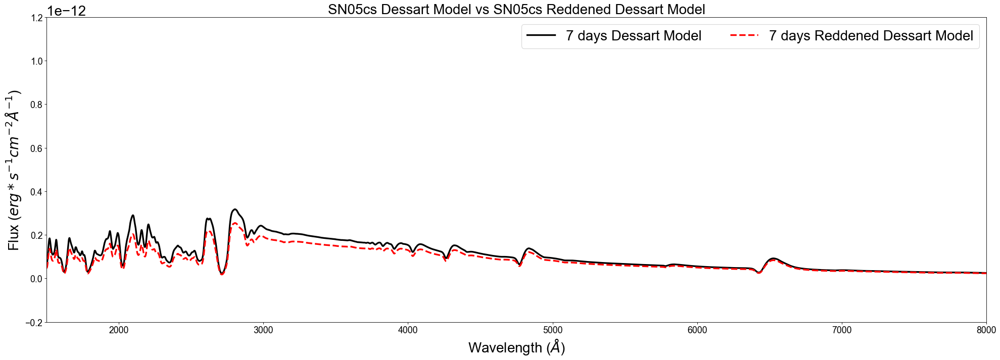

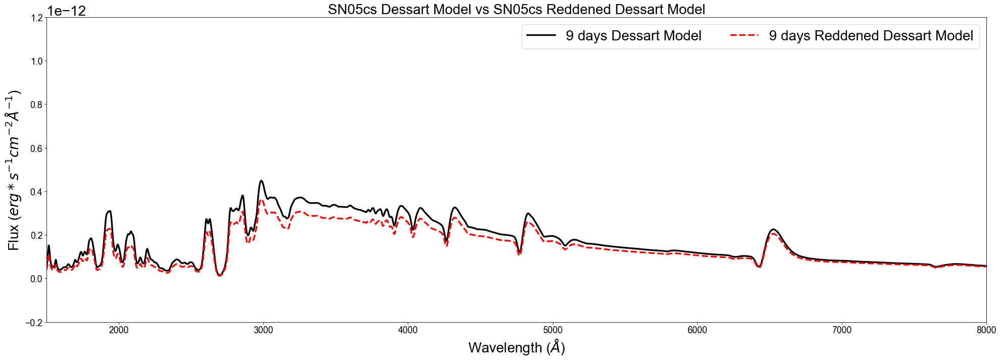

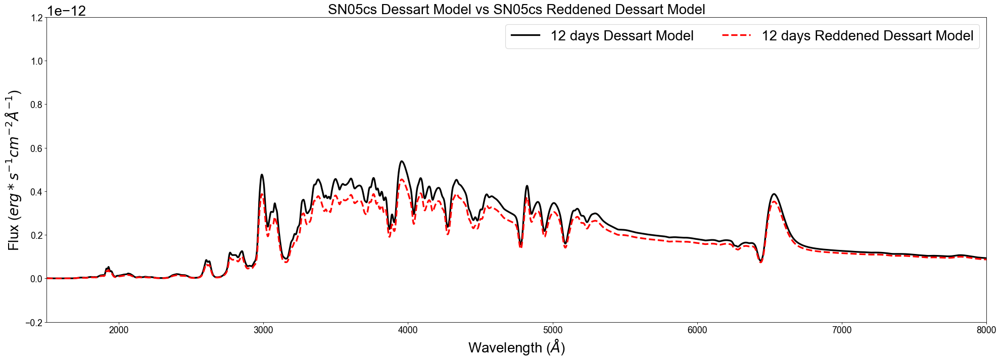

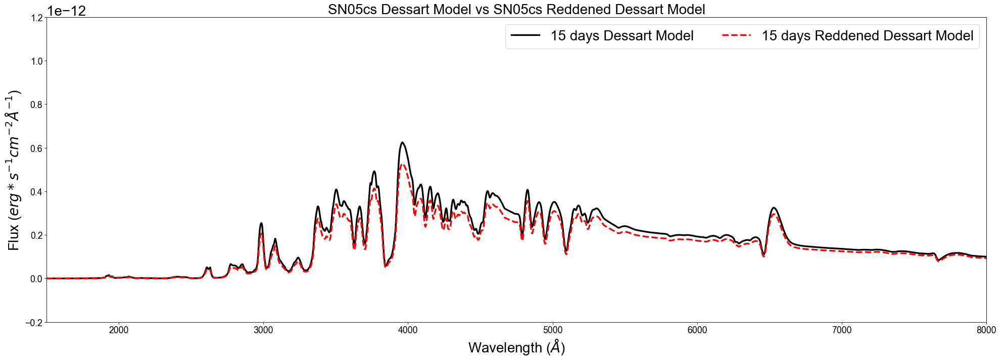

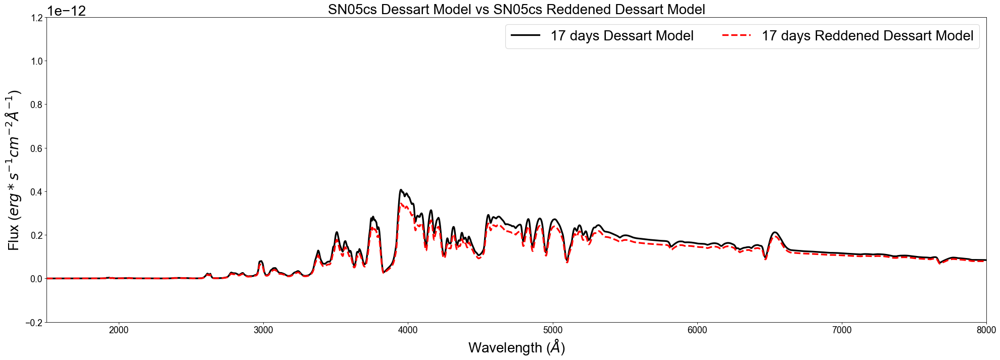

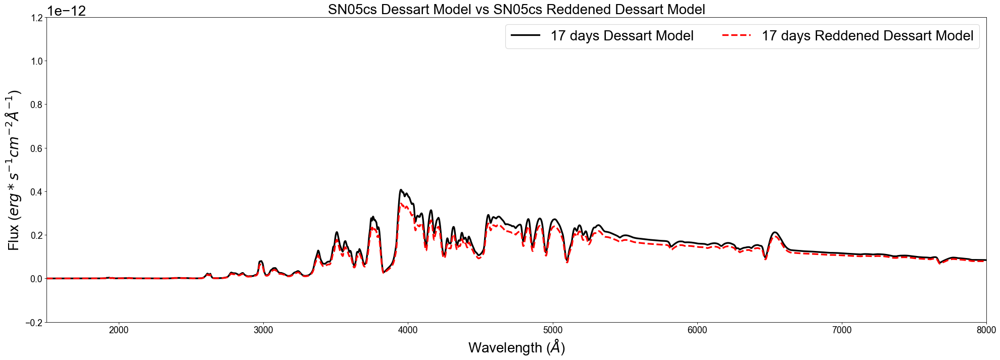

In [98]:
rednnotplot_c89(SN05cs_7_m,SN05cs_7_o,7.49*10**6,10,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_c89(SN05cs_9_m,SN05cs_9_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_c89(SN05cs_12_m,SN05cs_12_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_c89(SN05cs_15_m,SN05cs_15_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_c89(SN05cs_17_m,SN05cs_17_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_c89(SN05cs_17_m,SN05cs_23_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)

## Plotting for dust_extinction

In [99]:
# creating reddened DE plotting function
def redplot_de(model,obs,sndistance,fudge,ybot,ytop,rv,ebv):
    ###################### first import the model data
    wave_m, flux_m = np.loadtxt(model, unpack=True)
    ###################### then cut the model data for the extinction model limits
    wavecut_m = []
    fluxcut_m = []
    for w in range(len(wave_m)):
        if wave_m[w] <= 30000:
            wavecut_m.append(wave_m[w])
            fluxcut_m.append(flux_m[w])
    wavecut_m = wavecut_m * u.AA
    fluxcut_m = fluxcut_m * u.erg / (u.cm ** 2 * u.AA * u.s * u.sr)
    ###################### then import the observed spectra
    wave_o, flux_o, fluxerr_o = np.loadtxt(obs, unpack=True)
    ###################### reddening the model spectrum
    # define the model
    ext = F99(Rv=rv)
    # extinguish (redden) the model spectrum
    extflux_m = fluxcut_m*ext.extinguish(wavecut_m, Ebv=ebv)
    ###################### setting up file name grab
    def varName(p):
        for k, v in globals().items():
            if id(p) == id(v):
                return k
    # turning into string
    modelstr = varName(model)
    obsstr = varName(obs)
    # getting SN part
    def split_at(s, c, n):
        words = s.split(c)
        return c.join(words[:n]), c.join(words[n:])
    modelname = split_at(modelstr,'_',1)
    obsname = split_at(obsstr,'_',1)
    modelalmostday = split_at(modelstr,'_',2)
    modelday = split_at(modelalmostday[0],'_',1)
    obsalmostday = split_at(obsstr,'_',2)
    obsday = split_at(obsalmostday[0],'_',1)
    ###################### correcting for distance
    modeld = 1000 # distance for Dessart Model in pc
    scalefactor = (modeld**2)/(sndistance**2) # sndistance must be in pc
    ###################### now set up the plotting
    plt.rcParams.update({
        "lines.color": "black",
        "patch.edgecolor": "black",
        "text.color": "black",
        "axes.facecolor": "white",
        "axes.edgecolor": "black",
        "axes.labelcolor": "black",
        "xtick.color": "black",
        "ytick.color": "black",
        "grid.color": "white",
        "figure.facecolor": "white",
        "figure.edgecolor": "black",
        "savefig.facecolor": "white",
        "savefig.edgecolor": "black"})
    font = 25
    plt.rcParams["font.family"] = "arial"
    plt.rcParams.update({'font.size': font})
    fig = plt.figure(figsize=(30, 10), dpi= 80, facecolor='w', edgecolor='k')
    plt.title(modelname[0]+' Reddened Dessart Model vs '+obsname[0]+' Grism Spectrum',fontsize=font)
    plt.plot(wave_o,flux_o,label=obsday[1]+' days Grism Spectrum',linewidth=2,c='black')
    plt.plot(wavecut_m,extflux_m*scalefactor*fudge,label=modelday[1]+' days Dessart Model',linewidth=3,linestyle='dashed',c='red')
    plt.legend(loc=1,fontsize=font,ncol=2)
    plt.xlabel("Wavelength " r'($ \AA $)',fontsize=font)
    plt.ylabel("Flux " r'($ erg*s^{-1} cm^{-2} \AA^{-1} $)',fontsize=font)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.ylim(ybot,ytop)
    plt.xlim(1500,8000)
    plt.show()

### SN2006bp DE Reddened Model vs. Observations

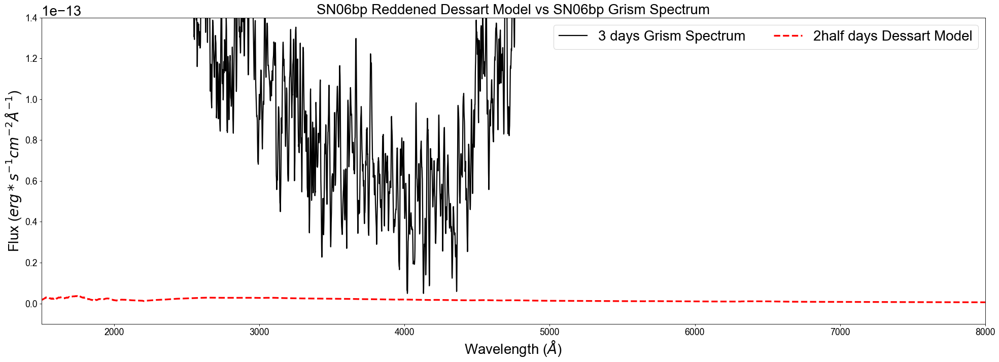

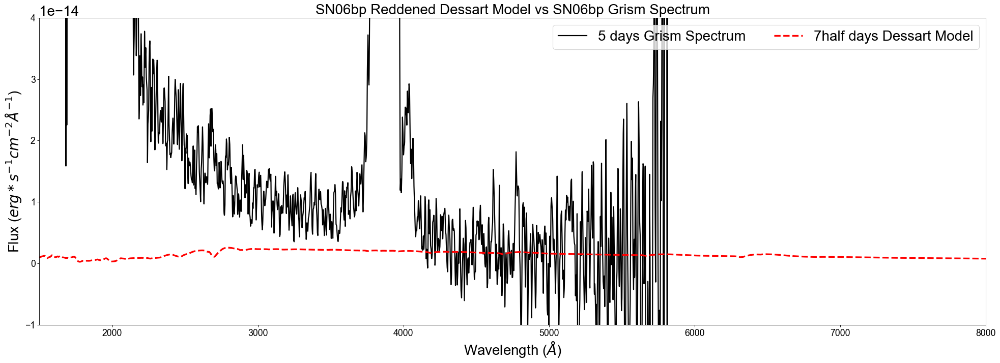

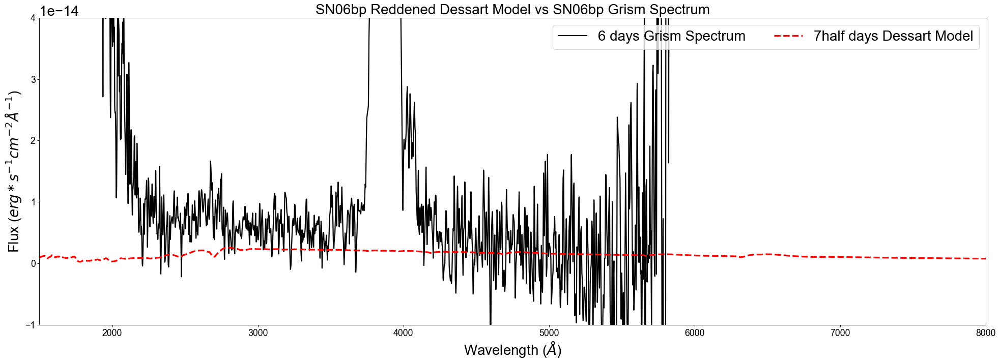

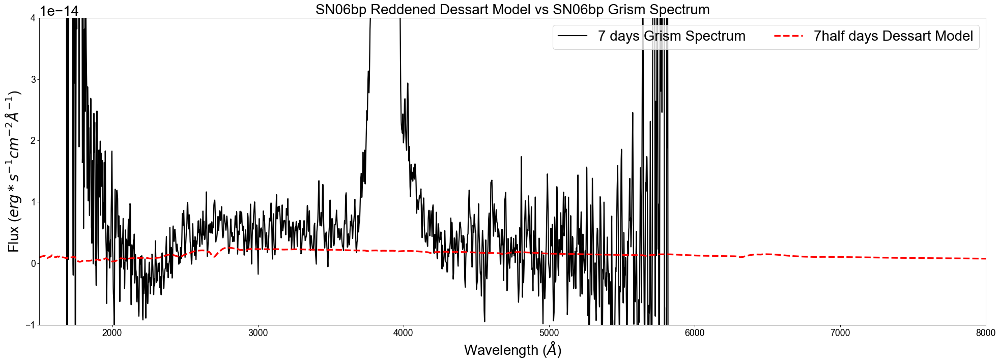

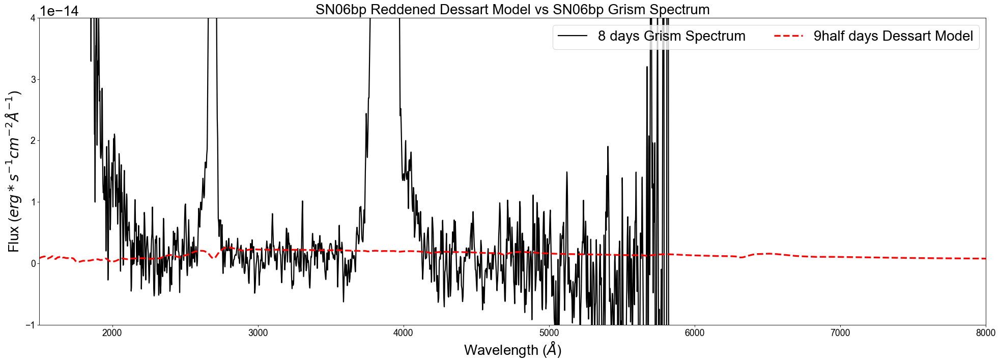

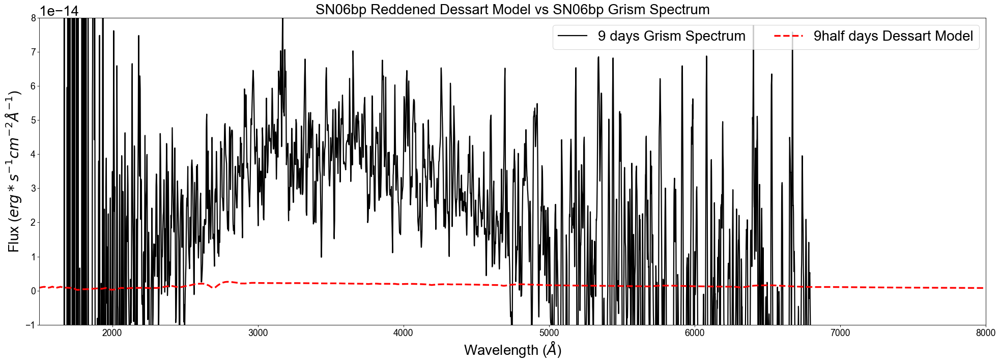

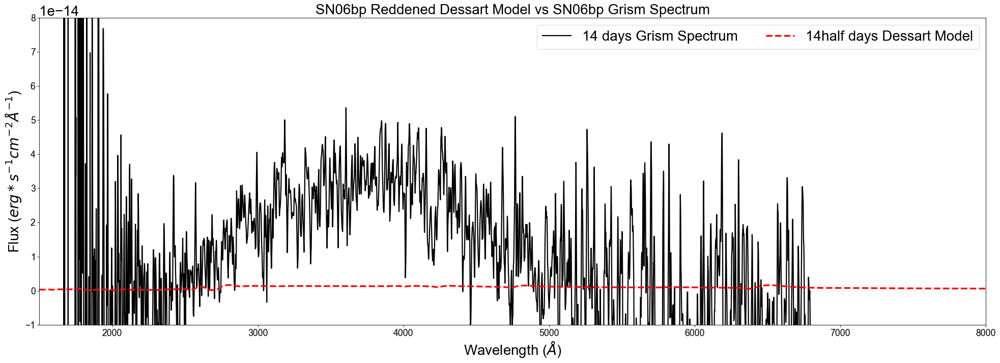

In [100]:
redplot_de(SN06bp_2half_m,SN06bp_3_o,17.5*10**6,1,-0.00000000000001,0.00000000000014,3.1,0.4)
redplot_de(SN06bp_7half_m,SN06bp_5_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
redplot_de(SN06bp_7half_m,SN06bp_6_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
redplot_de(SN06bp_7half_m,SN06bp_7_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
redplot_de(SN06bp_9half_m,SN06bp_8_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
redplot_de(SN06bp_9half_m,SN06bp_9_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)
redplot_de(SN06bp_14half_m,SN06bp_14_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)

### SN2005cs DE Reddened  Model vs. Observations

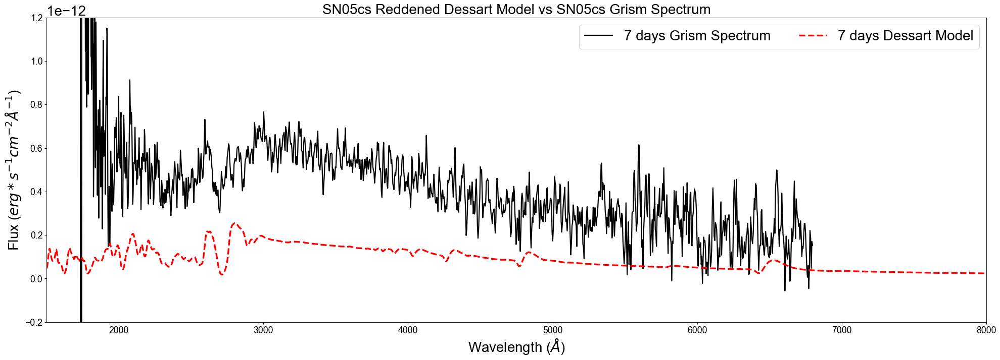

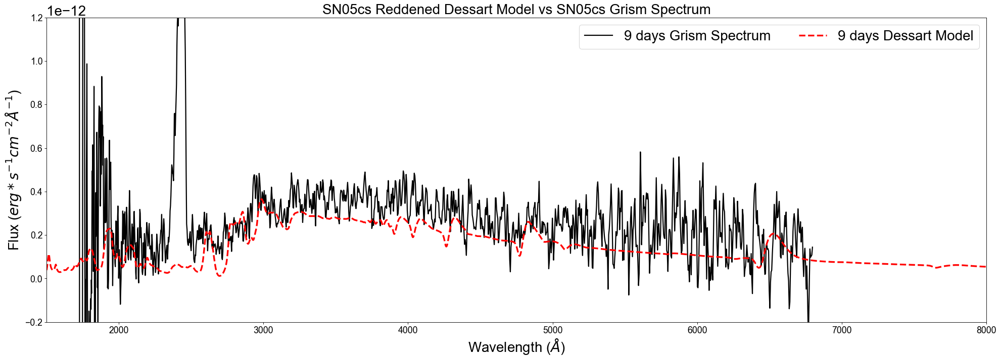

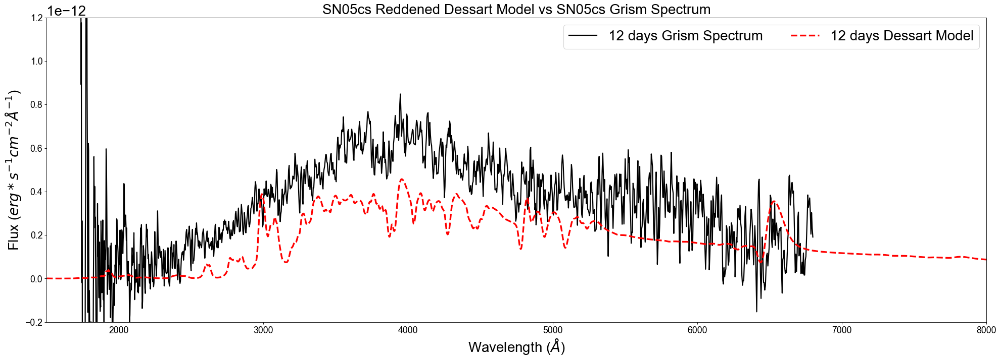

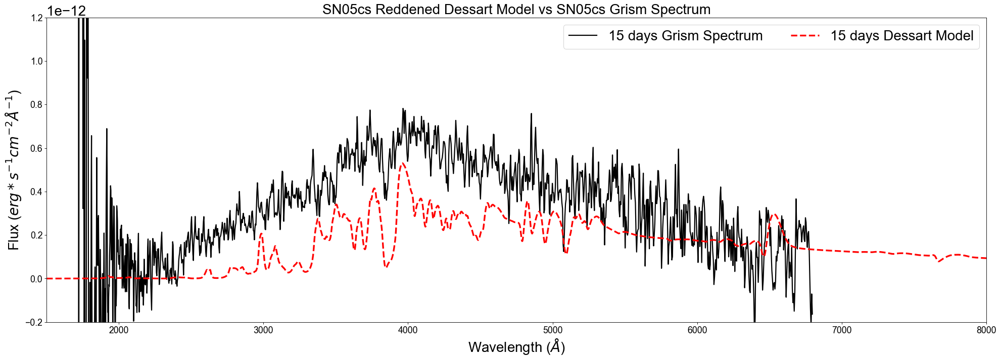

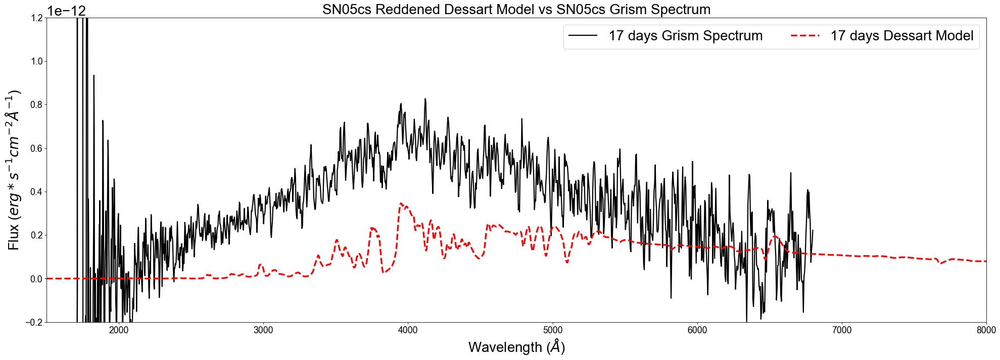

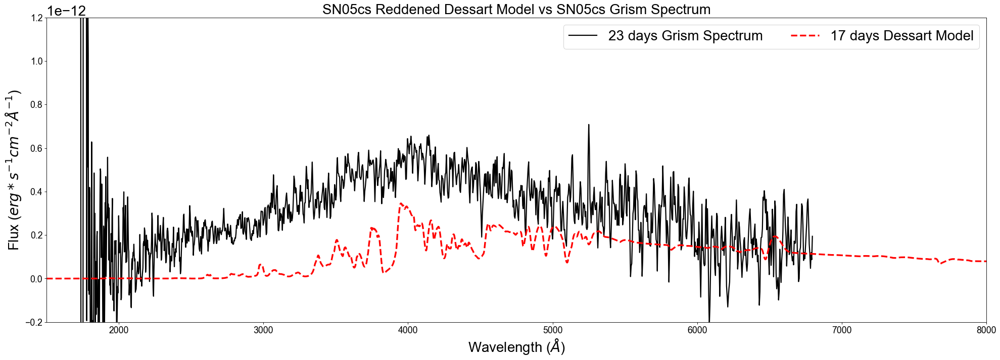

In [101]:
redplot_de(SN05cs_7_m,SN05cs_7_o,7.49*10**6,10,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_de(SN05cs_9_m,SN05cs_9_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_de(SN05cs_12_m,SN05cs_12_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_de(SN05cs_15_m,SN05cs_15_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_de(SN05cs_17_m,SN05cs_17_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
redplot_de(SN05cs_17_m,SN05cs_23_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)

In [109]:
# creating reddened DE plotting function for model vs. reddened model
def rednnotplot_de(model,obs,sndistance,fudge,ybot,ytop,rv,ebv):
    ###################### first import the model data
    wave_m, flux_m = np.loadtxt(model, unpack=True)
    ###################### then cut the model data for the extinction model limits
    wavecut_m = []
    fluxcut_m = []
    for w in range(len(wave_m)):
        if wave_m[w] <= 30000:
            wavecut_m.append(wave_m[w])
            fluxcut_m.append(flux_m[w])
    wavecut_m = wavecut_m * u.AA
    fluxcut_m = fluxcut_m * u.erg / (u.cm ** 2 * u.AA * u.s * u.sr)
    ###################### reddening the model spectrum
    # define the model
    ext = F99(Rv=rv)
    # extinguish (redden) the model spectrum
    extflux_m = fluxcut_m*ext.extinguish(wavecut_m, Ebv=ebv)
    ###################### setting up file name grab
    def varName(p):
        for k, v in globals().items():
            if id(p) == id(v):
                return k
    # turning into string
    modelstr = varName(model)
    # getting SN part
    def split_at(s, c, n):
        words = s.split(c)
        return c.join(words[:n]), c.join(words[n:])
    modelname = split_at(modelstr,'_',1)
    modelalmostday = split_at(modelstr,'_',2)
    modelday = split_at(modelalmostday[0],'_',1)
    ###################### correcting for distance
    modeld = 1000 # distance for Dessart Model in pc
    scalefactor = (modeld**2)/(sndistance**2) # sndistance must be in pc
    ###################### now set up the plotting
    plt.rcParams.update({
        "lines.color": "black",
        "patch.edgecolor": "black",
        "text.color": "black",
        "axes.facecolor": "white",
        "axes.edgecolor": "black",
        "axes.labelcolor": "black",
        "xtick.color": "black",
        "ytick.color": "black",
        "grid.color": "white",
        "figure.facecolor": "white",
        "figure.edgecolor": "black",
        "savefig.facecolor": "white",
        "savefig.edgecolor": "black"})
    font = 25
    plt.rcParams["font.family"] = "arial"
    plt.rcParams.update({'font.size': font})
    fig = plt.figure(figsize=(30, 10), dpi= 80, facecolor='w', edgecolor='k')
    plt.title(modelname[0]+' Dessart Model vs '+modelname[0]+' Reddened Dessart Model',fontsize=font)
    plt.plot(wave_m,flux_m*scalefactor*fudge,label=modelday[1]+' days Dessart Model',linewidth=3,c='black')
    plt.plot(wavecut_m,extflux_m*scalefactor*fudge,label=modelday[1]+' days Reddened Dessart Model',linewidth=3,linestyle='dashed',c='red')
    plt.legend(loc=1,fontsize=font,ncol=2)
    plt.xlabel("Wavelength " r'($ \AA $)',fontsize=font)
    plt.ylabel("Flux " r'($ erg*s^{-1} cm^{-2} \AA^{-1} $)',fontsize=font)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.ylim(ybot,ytop)
    plt.xlim(1500,8000)
    plt.show()

### SN2006bp Model vs. DE Reddened Model

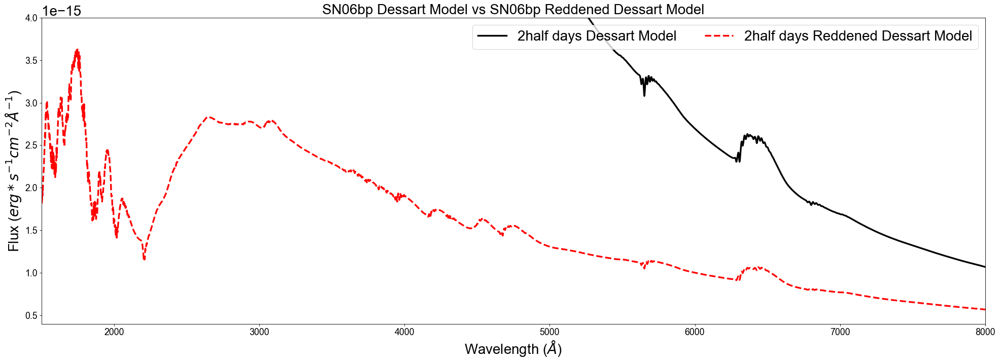

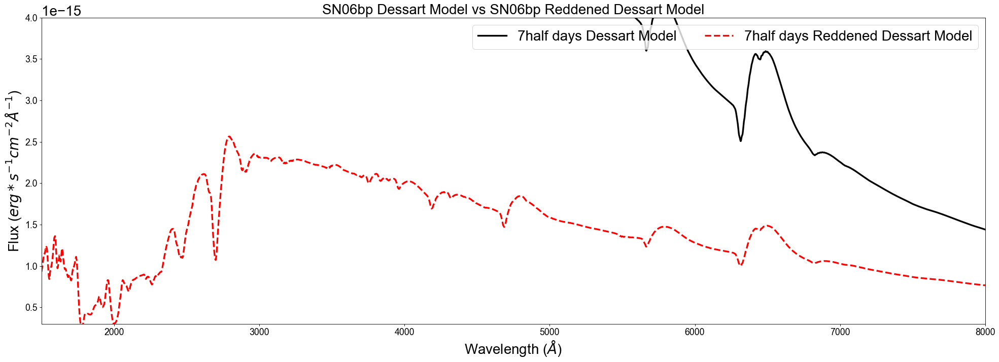

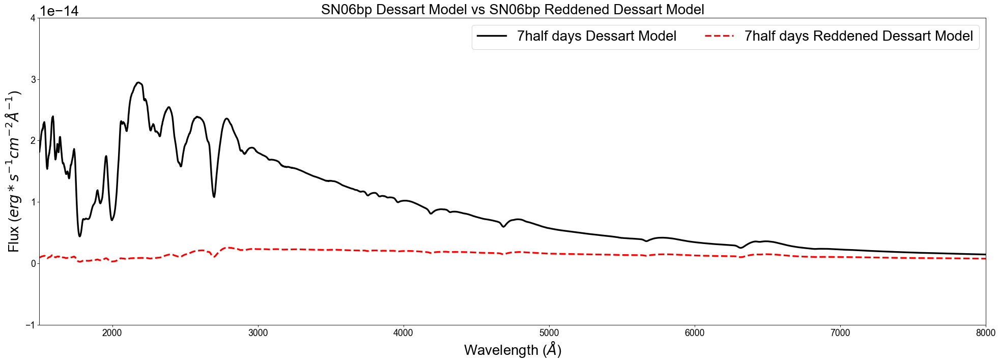

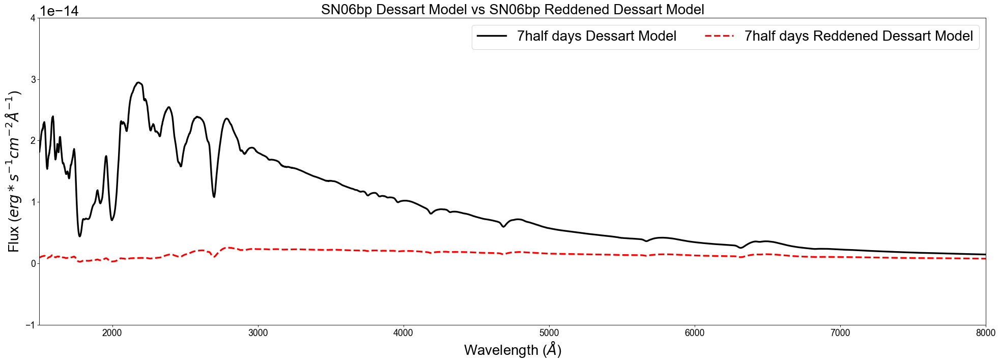

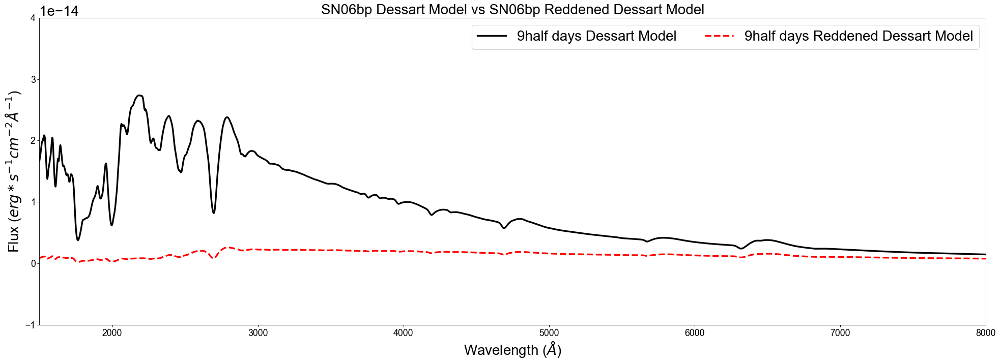

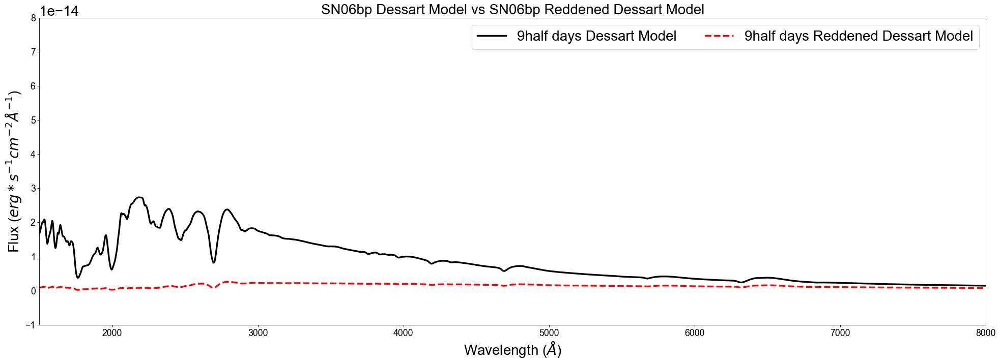

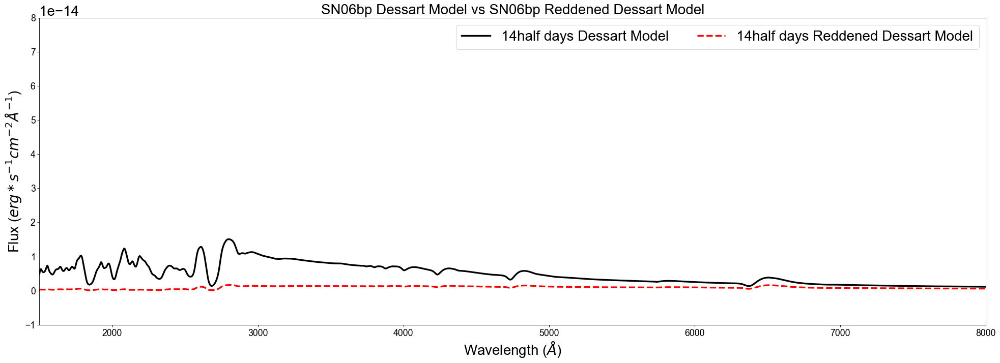

In [105]:
rednnotplot_de(SN06bp_2half_m,SN06bp_3_o,17.5*10**6,1,0.0000000000000004,0.000000000000004,3.1,0.4)
rednnotplot_de(SN06bp_7half_m,SN06bp_5_o,17.5*10**6,1,0.0000000000000003,0.000000000000004,3.1,0.4)
rednnotplot_de(SN06bp_7half_m,SN06bp_6_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
rednnotplot_de(SN06bp_7half_m,SN06bp_7_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
rednnotplot_de(SN06bp_9half_m,SN06bp_8_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
rednnotplot_de(SN06bp_9half_m,SN06bp_9_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)
rednnotplot_de(SN06bp_14half_m,SN06bp_14_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)

### SN2005cs Model vs. DE Reddened Model

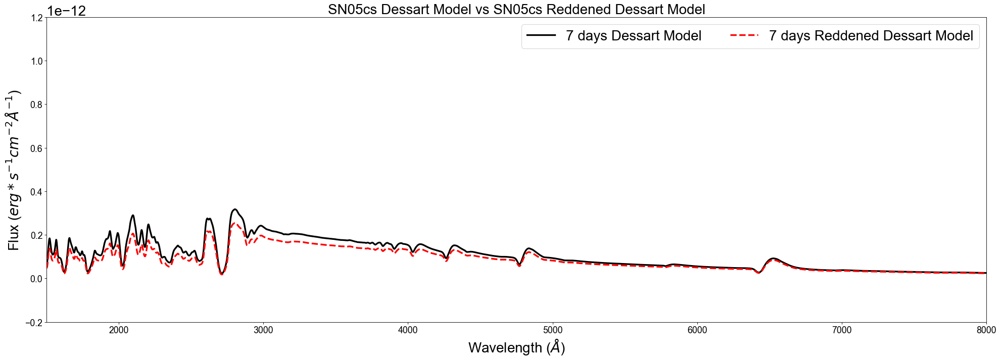

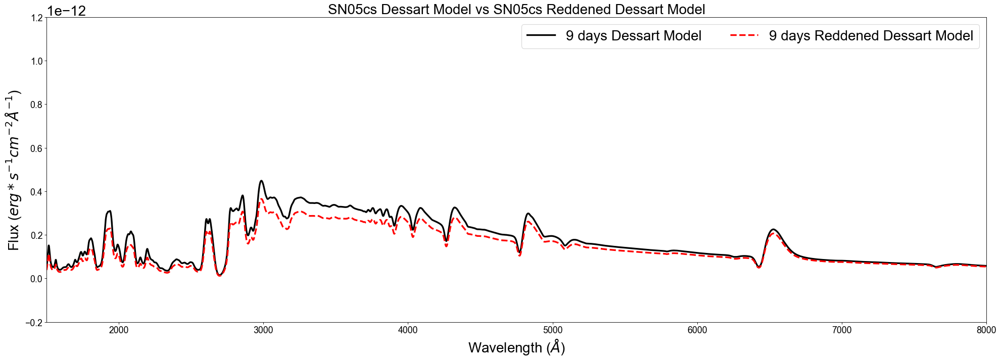

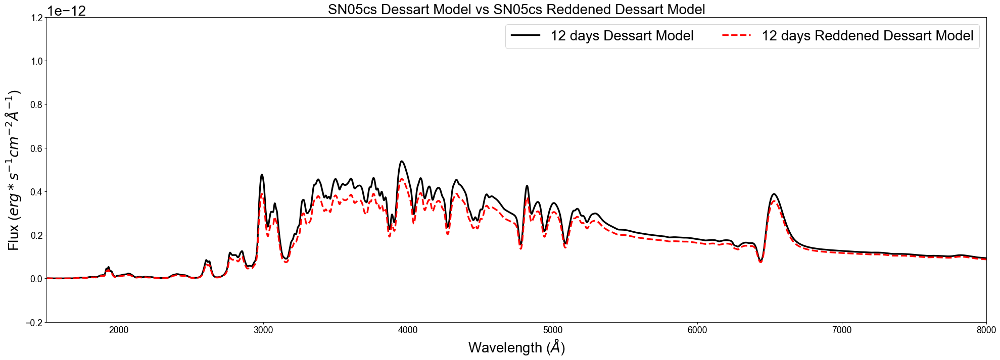

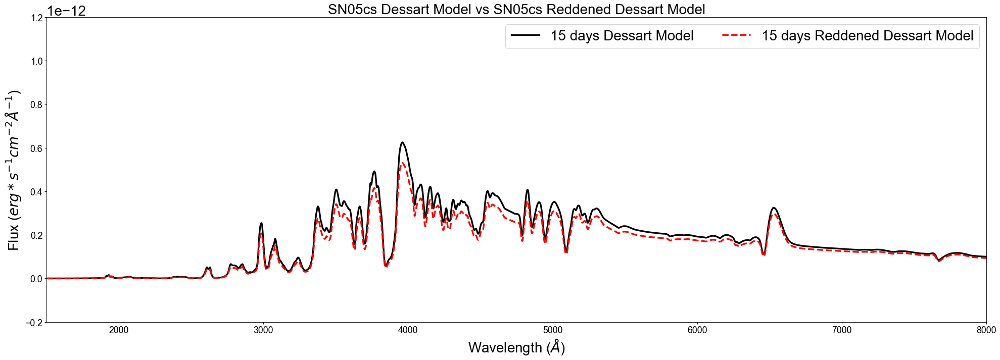

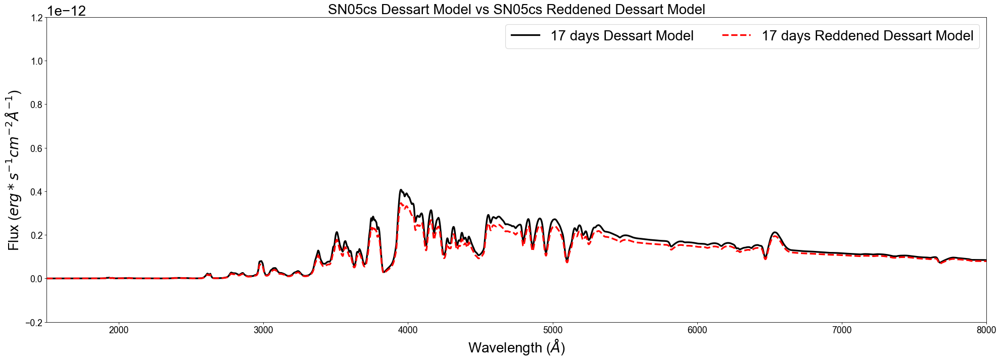

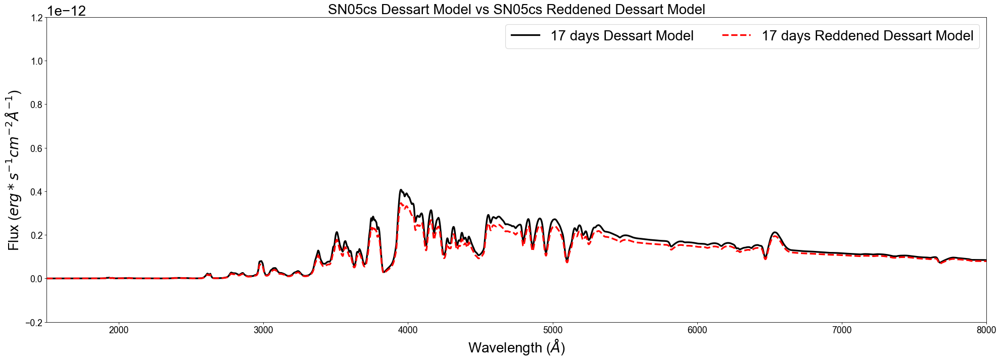

In [106]:
rednnotplot_de(SN05cs_7_m,SN05cs_7_o,7.49*10**6,10,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_de(SN05cs_9_m,SN05cs_9_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_de(SN05cs_12_m,SN05cs_12_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_de(SN05cs_15_m,SN05cs_15_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_de(SN05cs_17_m,SN05cs_17_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_de(SN05cs_17_m,SN05cs_23_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)

# Comparing Reddening Packages

In [108]:
# creating reddened DE plotting function for model vs. reddened model
def rednnotplot_compare(model,obs,sndistance,fudge,ybot,ytop,rv,ebv):
    ###################### first import the model data
    wave_m, flux_m = np.loadtxt(model, unpack=True)
    ###################### reddening the model spectrum with C89
    av = ebv*rv
    redflux_m = apply(ccm89(wave_m, av, rv, unit='aa', out=None), flux_m)
    ###################### reddening the model spectrum with DE
    # cut the model data for the extinction model limits
    wavecut_m = []
    fluxcut_m = []
    for w in range(len(wave_m)):
        if wave_m[w] <= 30000:
            wavecut_m.append(wave_m[w])
            fluxcut_m.append(flux_m[w])
    wavecut_m = wavecut_m * u.AA
    fluxcut_m = fluxcut_m * u.erg / (u.cm ** 2 * u.AA * u.s * u.sr)
    # define the model
    ext = F99(Rv=rv)
    # extinguish (redden) the model spectrum
    extflux_m = fluxcut_m*ext.extinguish(wavecut_m, Ebv=ebv)
    ###################### setting up file name grab
    def varName(p):
        for k, v in globals().items():
            if id(p) == id(v):
                return k
    # turning into string
    modelstr = varName(model)
    # getting SN part
    def split_at(s, c, n):
        words = s.split(c)
        return c.join(words[:n]), c.join(words[n:])
    modelname = split_at(modelstr,'_',1)
    modelalmostday = split_at(modelstr,'_',2)
    modelday = split_at(modelalmostday[0],'_',1)
    ###################### correcting for distance
    modeld = 1000 # distance for Dessart Model in pc
    scalefactor = (modeld**2)/(sndistance**2) # sndistance must be in pc
    ###################### now set up the plotting
    plt.rcParams.update({
        "lines.color": "black",
        "patch.edgecolor": "black",
        "text.color": "black",
        "axes.facecolor": "white",
        "axes.edgecolor": "black",
        "axes.labelcolor": "black",
        "xtick.color": "black",
        "ytick.color": "black",
        "grid.color": "white",
        "figure.facecolor": "white",
        "figure.edgecolor": "black",
        "savefig.facecolor": "white",
        "savefig.edgecolor": "black"})
    font = 25
    plt.rcParams["font.family"] = "arial"
    plt.rcParams.update({'font.size': font})
    fig = plt.figure(figsize=(30, 10), dpi= 80, facecolor='w', edgecolor='k')
    plt.title(modelname[0]+' Dessart Model vs '+modelname[0]+' Reddened Dessart Model',fontsize=font)
    plt.plot(wave_m,flux_m*scalefactor*fudge,label=modelday[1]+' days Dessart Model',linewidth=3,c='black')
    plt.plot(wave_m,redflux_m*scalefactor*fudge,label=modelday[1]+' days Reddened C89 Dessart Model',linewidth=3,linestyle='dashed',c='red')
    plt.plot(wavecut_m,extflux_m*scalefactor*fudge,label=modelday[1]+' days Reddened DE Dessart Model',linewidth=3,linestyle='dashed',c='blue')
    plt.legend(loc=1,fontsize=font,ncol=2)
    plt.xlabel("Wavelength " r'($ \AA $)',fontsize=font)
    plt.ylabel("Flux " r'($ erg*s^{-1} cm^{-2} \AA^{-1} $)',fontsize=font)
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    plt.ylim(ybot,ytop)
    plt.xlim(1500,8000)
    plt.show()

### SN2006bp Model vs. C89 Reddened Model vs. DE Reddened Model

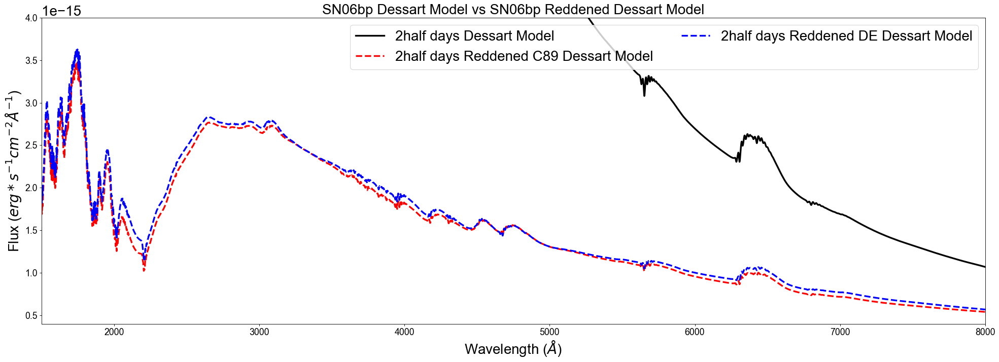

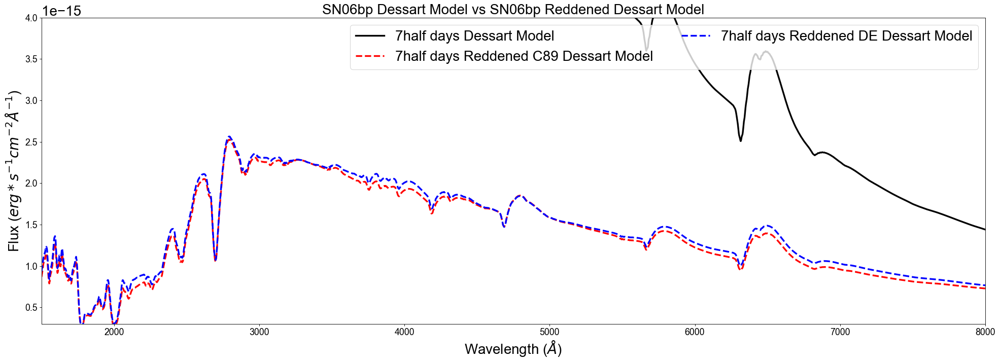

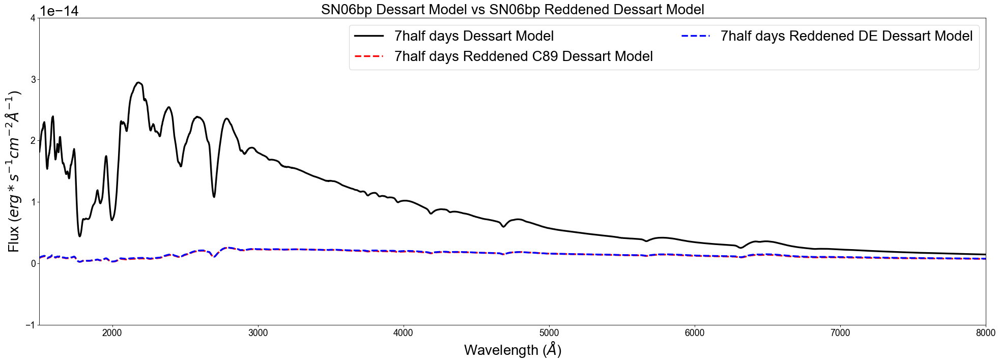

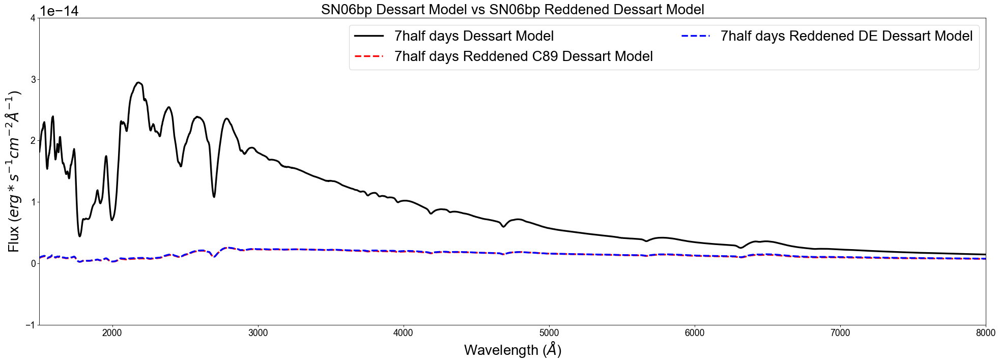

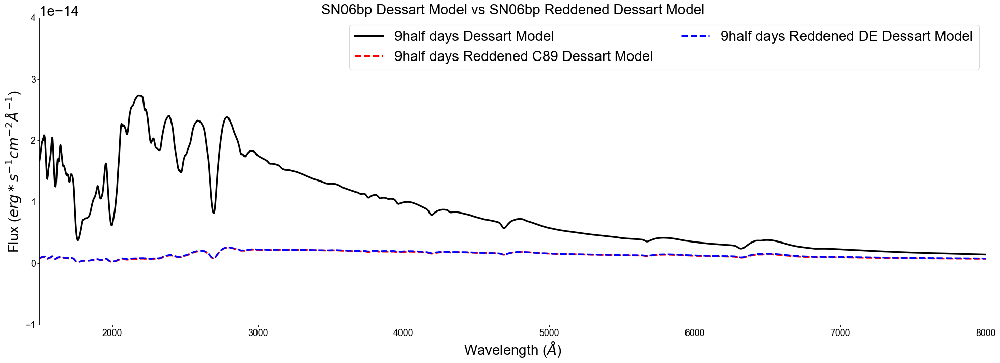

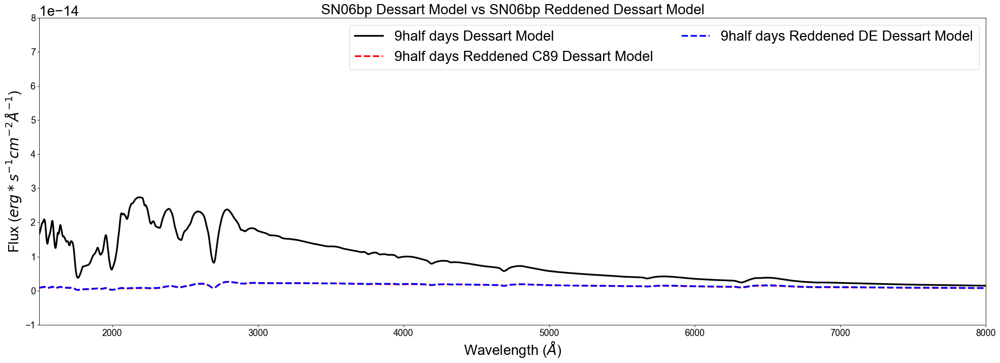

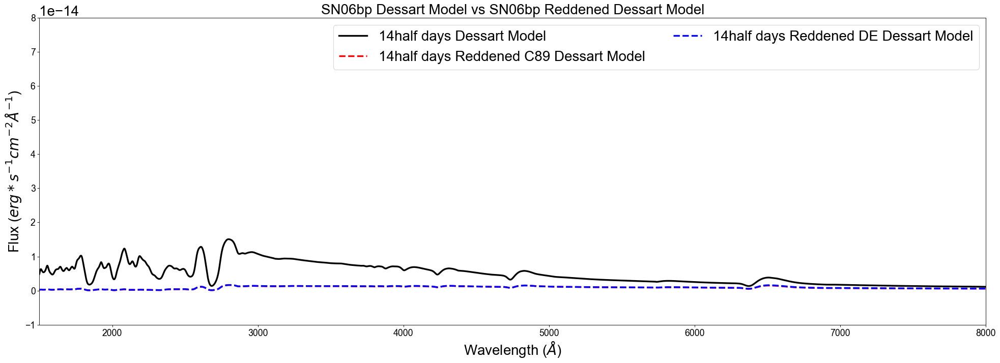

In [110]:
rednnotplot_compare(SN06bp_2half_m,SN06bp_3_o,17.5*10**6,1,0.0000000000000004,0.000000000000004,3.1,0.4)
rednnotplot_compare(SN06bp_7half_m,SN06bp_5_o,17.5*10**6,1,0.0000000000000003,0.000000000000004,3.1,0.4)
rednnotplot_compare(SN06bp_7half_m,SN06bp_6_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
rednnotplot_compare(SN06bp_7half_m,SN06bp_7_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
rednnotplot_compare(SN06bp_9half_m,SN06bp_8_o,17.5*10**6,1,-0.00000000000001,0.00000000000004,3.1,0.4)
rednnotplot_compare(SN06bp_9half_m,SN06bp_9_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)
rednnotplot_compare(SN06bp_14half_m,SN06bp_14_o,17.5*10**6,1,-0.00000000000001,0.00000000000008,3.1,0.4)

### SN2005cs Model vs. C89 Reddened Model vs. DE Reddened Model

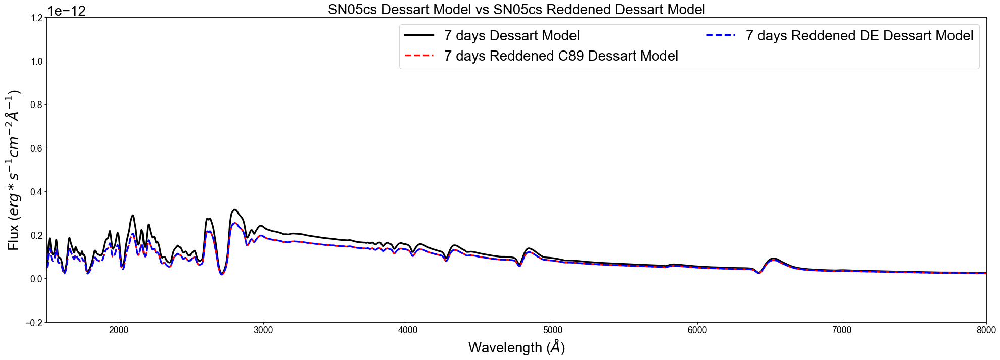

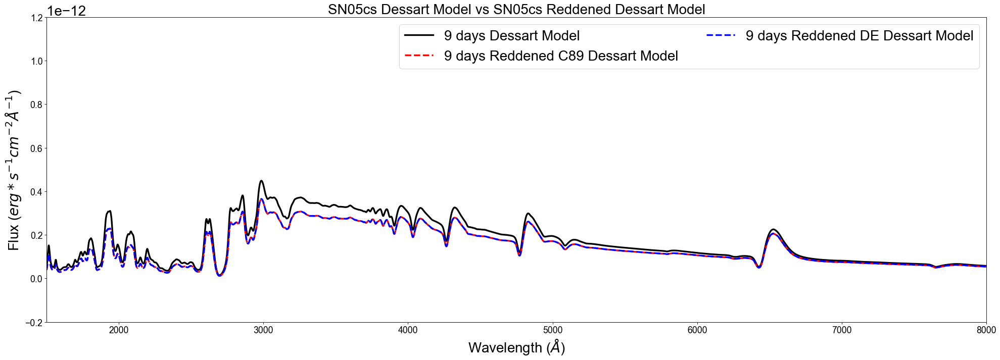

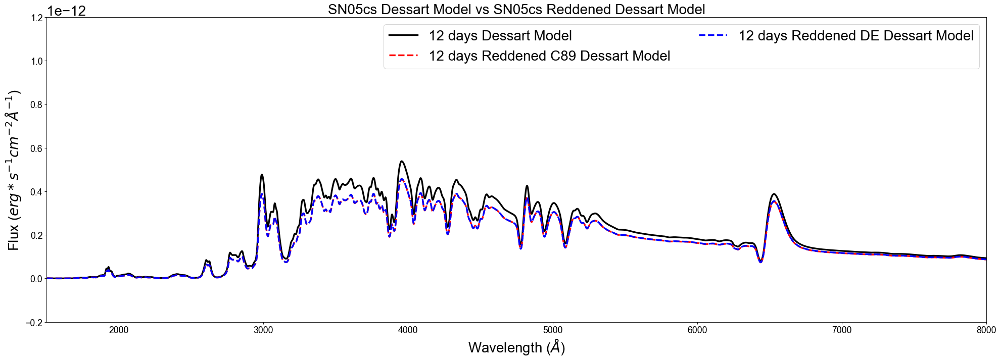

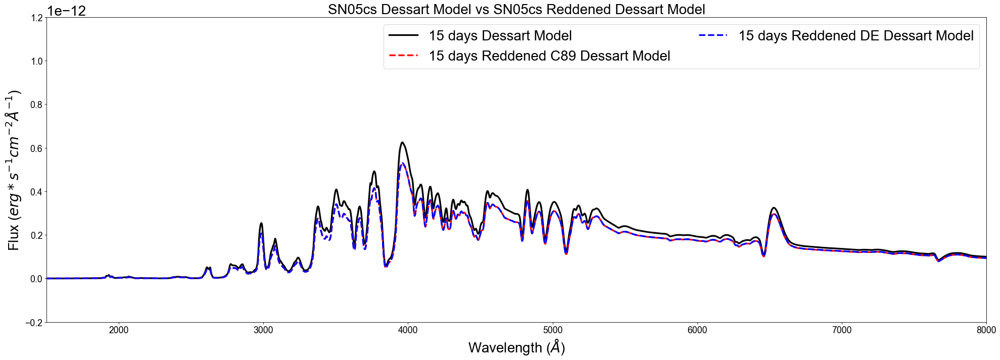

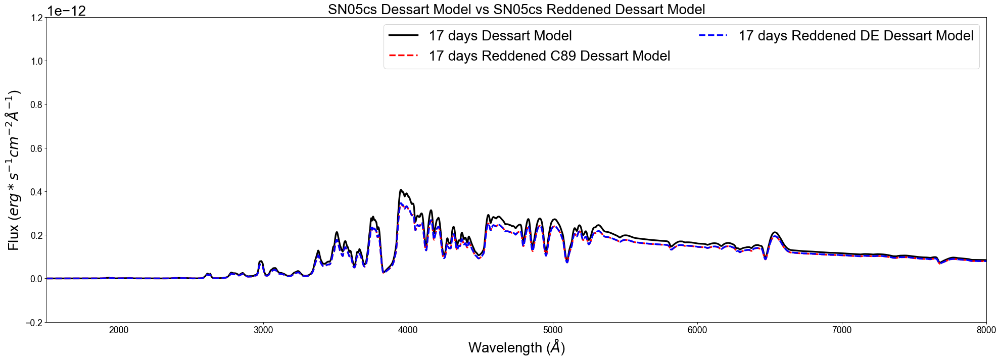

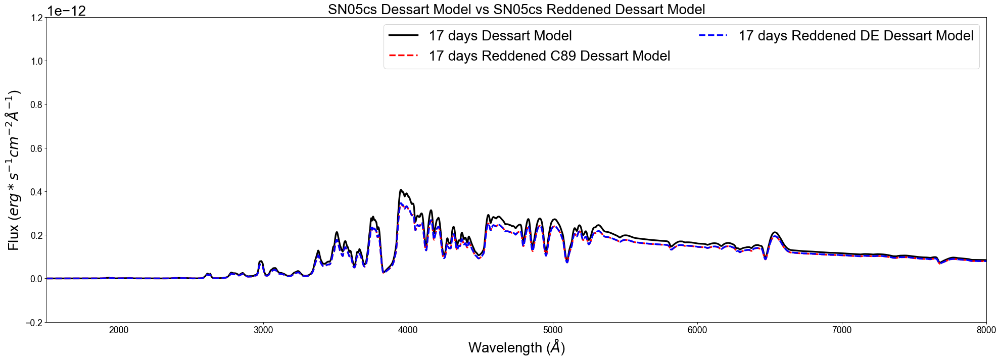

In [111]:
rednnotplot_compare(SN05cs_7_m,SN05cs_7_o,7.49*10**6,10,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_compare(SN05cs_9_m,SN05cs_9_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_compare(SN05cs_12_m,SN05cs_12_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_compare(SN05cs_15_m,SN05cs_15_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_compare(SN05cs_17_m,SN05cs_17_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)
rednnotplot_compare(SN05cs_17_m,SN05cs_23_o,7.49*10**6,25,-0.0000000000002,0.0000000000012,3.1,0.04)

[ 1000.          1003.41040422  1006.8324393   1010.26614491
  1013.71156084  1017.16872703  1020.63768355  1024.11847062
  1027.61112857  1031.11569791  1034.63221924  1038.16073333
  1041.70128108  1045.25390353  1048.81864186  1052.39553738
  1055.98463157  1059.58596602  1063.19958247  1066.82552282
  1070.46382909  1074.11454345  1077.77770823  1081.45336587
  1085.141559    1088.84233036  1092.55572284  1096.28177949
  1100.0205435   1103.77205821  1107.5363671   1111.31351381
  1115.10354211  1118.90649594  1122.72241938  1126.55135666
  1130.39335216  1134.24845043  1138.11669613  1141.99813412
  1145.89280938  1149.80076706  1153.72205245  1157.65671101
  1161.60478835  1165.56633022  1169.54138256  1173.52999143
  1177.53220307  1181.54806387  1185.57762038  1189.6209193
  1193.67800751  1197.74893203  1201.83374005  1205.93247891
  1210.04519613  1214.17193938  1218.31275649  1222.46769546
  1226.63680445  1230.82013179  1235.01772597  1239.22963564
  1243.45590962  1247.696

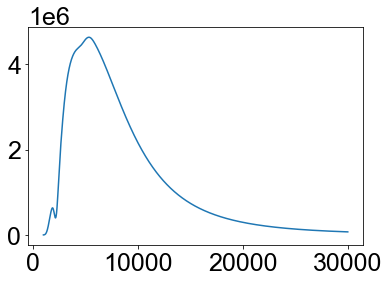

In [30]:
from astropy.modeling.models import BlackBody
import astropy.units as u
from dust_extinction.parameter_averages import F99

# wavelengths and spectrum are 1D arrays
# wavelengths between 1000 and 30000 A
wavelengths = np.logspace(np.log10(1000), np.log10(3e4), num=1000)*u.AA
bb_lam = BlackBody(10000*u.K, scale=1.0 * u.erg / (u.cm ** 2 * u.AA * u.s * u.sr))
spectrum = bb_lam(wavelengths)

# define the model
ext = F99(Rv=3.1)

# extinguish (redden) the spectrum
spectrum_ext = spectrum*ext.extinguish(wavelengths, Ebv=0.5)

plt.plot(wavelengths,spectrum_ext)
print(wavelengths)

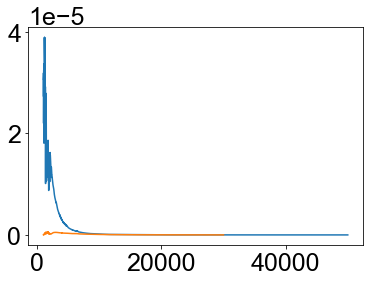

In [92]:
####### cut at 30000AA

wavee_m, fluxx_m = np.loadtxt(SN06bp_2half_m, unpack=True)
waveee_m = []
fluxxx_m = []
for w in range(len(wavee_m)):
    if wavee_m[w] <= 30000:
        waveee_m.append(wavee_m[w])
        fluxxx_m.append(fluxx_m[w])
#waveee_m = 1 / (wavee_m *10**(-4) ) # convert from angstrom to 1/micron
waveee_m = np.array(waveee_m) * u.AA
fluxxx_m = np.array(fluxxx_m) * u.erg / (u.cm ** 2 * u.AA * u.s * u.sr)

# define the model
ext = F99(Rv=3.1)

#red = ext.extinguish(wavee_m, Ebv=0.5)

# extinguish (redden) the spectrum
flux_ext = fluxxx_m*ext.extinguish(waveee_m, Ebv=0.5)

plt.plot(wavee_m,fluxx_m)
plt.plot(waveee_m,flux_ext)

#print(wavee_m)
#print(waveee_m)

In [ ]:
For i in range(len(flux)):
If flux[I] meets criteria then append flux[I]
Append wavelength[I]
Flux1.append(flux[I])